In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import Data_v2
import Data_analysis_func
import Model_checks
import seaborn as sns
from scipy.stats import multivariate_normal
from sklearn.linear_model import LinearRegression
import Outlier_detection_v2
import Genes_self_similarity_v2
from matplotlib_venn import venn2, venn2_circles
import Feature_engineering
import Clusters
from tqdm import tqdm
from dtaidistance import dtw
from Clusters import dim_reduc
from archetypes import AA

In [559]:
data = Data_v2.get_format_data_without_na()

In [560]:
data_norm_flagged = Data_v2.get_norm_flagged_data()

/Users/samsongourevitch/Documents/Chlamy_Project_Github/Chlamy_project/Data_v2.py:198: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  for i in range(1, 81):  # Assuming you have 'y2_1' to 'y2_80' columns
/Users/samsongourevitch/Documents/Chlamy_Project_Github/Chlamy_project/Data_v2.py:206: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  


In [561]:
data_norm_flagged[(data_norm_flagged['mutant_ID'] == 'WT') & (data_norm_flagged['plate'] != 99) & (data_norm_flagged['flag_y2'] =='weird')]

,plate,measurement,start_date,light_regime,dark_threshold,light_threshold,num_frames,i,j,fv_fm,mask_area,y2_1,y2_2,y2_3,y2_4,y2_5,y2_6,y2_7,y2_8,y2_9,y2_10,y2_11,y2_12,y2_13,y2_14,y2_15,y2_16,y2_17,y2_18,y2_19,y2_20,y2_21,y2_22,y2_23,y2_24,y2_25,y2_26,y2_27,y2_28,y2_29,y2_30,y2_31,y2_32,y2_33,y2_34,y2_35,y2_36,y2_37,y2_38,y2_39,y2_40,y2_41,y2_42,y2_43,y2_44,y2_45,y2_46,y2_47,y2_48,y2_49,y2_50,y2_51,y2_52,y2_53,y2_54,y2_55,y2_56,y2_57,y2_58,y2_59,y2_60,y2_61,y2_62,y2_63,y2_64,y2_65,y2_66,y2_67,y2_68,y2_69,y2_70,y2_71,y2_72,y2_73,y2_74,y2_75,y2_76,y2_77,y2_78,y2_79,y2_80,ynpq_1,ynpq_2,ynpq_3,ynpq_4,ynpq_5,ynpq_6,ynpq_7,ynpq_8,ynpq_9,ynpq_10,ynpq_11,ynpq_12,ynpq_13,ynpq_14,ynpq_15,ynpq_16,ynpq_17,ynpq_18,ynpq_19,ynpq_20,ynpq_21,ynpq_22,ynpq_23,ynpq_24,ynpq_25,ynpq_26,ynpq_27,ynpq_28,ynpq_29,ynpq_30,ynpq_31,ynpq_32,ynpq_33,ynpq_34,ynpq_35,ynpq_36,ynpq_37,ynpq_38,ynpq_39,ynpq_40,ynpq_41,ynpq_42,ynpq_43,ynpq_44,ynpq_45,ynpq_46,ynpq_47,ynpq_48,ynpq_49,ynpq_50,ynpq_51,ynpq_52,ynpq_53,ynpq_54,ynpq_55,ynpq_56,ynpq_57,ynpq_58,ynpq_59,ynpq_60,ynpq_61,ynpq_62,ynpq_63,ynpq_64,ynpq_65,ynpq_66,ynpq_67,ynpq_68,ynpq_69,ynpq_70,ynpq_71,ynpq_72,ynpq_73,ynpq_74,ynpq_75,ynpq_76,ynpq_77,ynpq_78,ynpq_79,ynpq_80,measurement_time_0,measurement_time_1,measurement_time_2,measurement_time_3,measurement_time_4,measurement_time_5,measurement_time_6,measurement_time_7,measurement_time_8,measurement_time_9,measurement_time_10,measurement_time_11,measurement_time_12,measurement_time_13,measurement_time_14,measurement_time_15,measurement_time_16,measurement_time_17,measurement_time_18,measurement_time_19,measurement_time_20,measurement_time_21,measurement_time_22,measurement_time_23,measurement_time_24,measurement_time_25,measurement_time_26,measurement_time_27,measurement_time_28,measurement_time_29,measurement_time_30,measurement_time_31,measurement_time_32,measurement_time_33,measurement_time_34,measurement_time_35,measurement_time_36,measurement_time_37,measurement_time_38,measurement_time_39,measurement_time_40,measurement_time_41,measurement_time_42,measurement_time_43,measurement_time_44,measurement_time_45,measurement_time_46,measurement_time_47,measurement_time_48,measurement_time_49,measurement_time_50,measurement_time_51,measurement_time_52,measurement_time_53,measurement_time_54,measurement_time_55,measurement_time_56,measurement_time_57,measurement_time_58,measurement_time_59,measurement_time_60,measurement_time_61,measurement_time_62,measurement_time_63,measurement_time_64,measurement_time_65,measurement_time_66,measurement_time_67,measurement_time_68,measurement_time_69,measurement_time_70,measurement_time_71,measurement_time_72,measurement_time_73,measurement_time_74,measurement_time_75,measurement_time_76,measurement_time_77,measurement_time_78,measurement_time_79,measurement_time_80,measurement_time_81,F_0,Fm_0,F_1,Fm_1,F_2,Fm_2,F_3,Fm_3,F_4,Fm_4,F_5,Fm_5,F_6,Fm_6,F_7,Fm_7,F_8,Fm_8,F_9,Fm_9,F_10,Fm_10,F_11,Fm_11,F_12,Fm_12,F_13,Fm_13,F_14,Fm_14,F_15,Fm_15,F_16,Fm_16,F_17,Fm_17,F_18,Fm_18,F_19,Fm_19,F_20,Fm_20,F_21,Fm_21,F_22,Fm_22,F_23,Fm_23,F_24,Fm_24,F_25,Fm_25,F_26,Fm_26,F_27,Fm_27,F_28,Fm_28,F_29,Fm_29,F_30,Fm_30,F_31,Fm_31,F_32,Fm_32,F_33,Fm_33,F_34,Fm_34,F_35,Fm_35,F_36,Fm_36,F_37,Fm_37,F_38,Fm_38,F_39,Fm_39,F_40,Fm_40,F_41,Fm_41,F_42,Fm_42,F_43,Fm_43,F_44,Fm_44,F_45,Fm_45,F_46,Fm_46,F_47,Fm_47,F_48,Fm_48,F_49,Fm_49,F_50,Fm_50,F_51,Fm_51,F_52,Fm_52,F_53,Fm_53,F_54,Fm_54,F_55,Fm_55,F_56,Fm_56,F_57,Fm_57,F_58,Fm_58,F_59,Fm_59,F_60,Fm_60,F_61,Fm_61,F_62,Fm_62,F_63,Fm_63,F_64,Fm_64,F_65,Fm_65,F_66,Fm_66,F_67,Fm_67,F_68,Fm_68,F_69,Fm_69,F_70,Fm_70,F_71,Fm_71,F_72,Fm_72,F_73,Fm_73,F_74,Fm_74,F_75,Fm_75,F_76,Fm_76,F_77,Fm_77,F_78,Fm_78,F_79,Fm_79,F_80,Fm_80,F_81,Fm_81,well_id,mutant_ID,feature,mutated_genes,num_mutations,fv_fm_end,ynpqend,well_id_numeric,mean_y2,mean_ynpq,median,log_likelihood_null,mutated_genes_light_regime_count,fv_fm_WT,fv_fm_end_WT,ynpqend_WT,flag_y2,flag_ynpq
4679,4,M2,2023-10-31,1min-1min,18.478911,26.356496,164,13,2,0.01

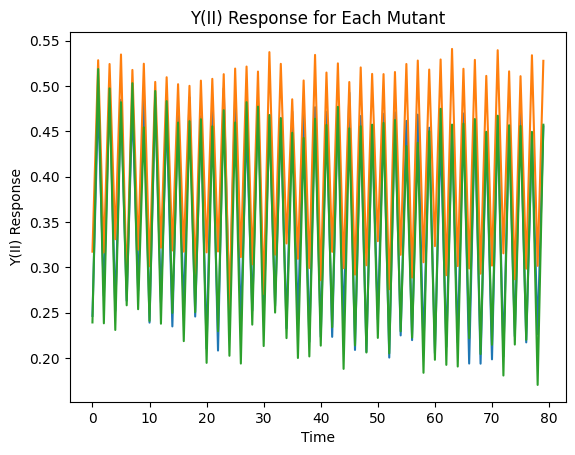

In [563]:
Data_analysis_func.plot_y2(data[(data['plate'] == 4) & (data['mutant_ID'] == 'WT') & (data['light_regime'] == '30s-30s')])

In [602]:
data_norm_flagged[(data_norm_flagged['mutated_genes'] == data_norm_flagged['mutated_genes'].unique()[7]) & (data_norm_flagged['light_regime'] == '20h_HL')]['plate']

1176      2
1211      2
1254      2
14436     9
29736    16
Name: plate, dtype: int64

In [5]:
Data_analysis_func.plot_y2(data_norm_flagged[(data_norm_flagged['mutated_genes'] == data_norm_flagged['mutated_genes'].unique()[7]) & (data_norm_flagged['light_regime'] == '20h_HL') & (data_norm_flagged['flag_y2'] == 'ok')], title='Y(II) from the centered data for every Cre09.g400850 mutants')

NameError: name 'data_norm_flagged' is not defined

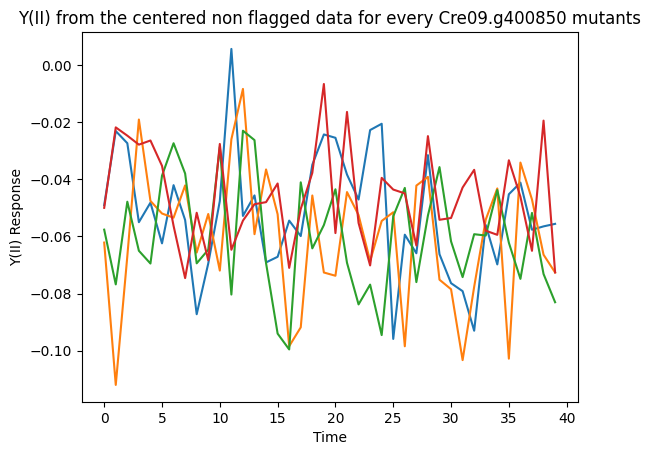

In [608]:
Data_analysis_func.plot_y2(data_norm_flagged[(data_norm_flagged['mutated_genes'] == data_norm_flagged['mutated_genes'].unique()[7]) & (data_norm_flagged['light_regime'] == '20h_HL') & (data_norm_flagged['flag_y2'] == 'ok')], title='Y(II) from the centered non flagged data for every Cre09.g400850 mutants')

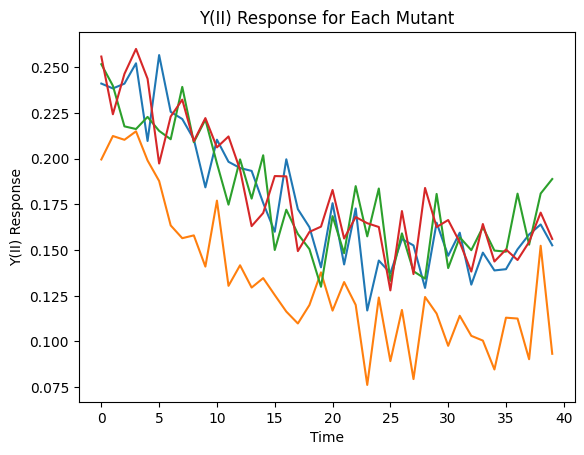

In [603]:
Data_analysis_func.plot_y2(data[(data['plate'] == 16) & ((data['mutated_genes'] == data['mutated_genes'].unique()[7]) | (data['mutated_genes'] == '')) & (data['light_regime'] == '20h_HL')])

In [605]:
data['mutated_genes'].unique()[7]

'Cre09.g400850'

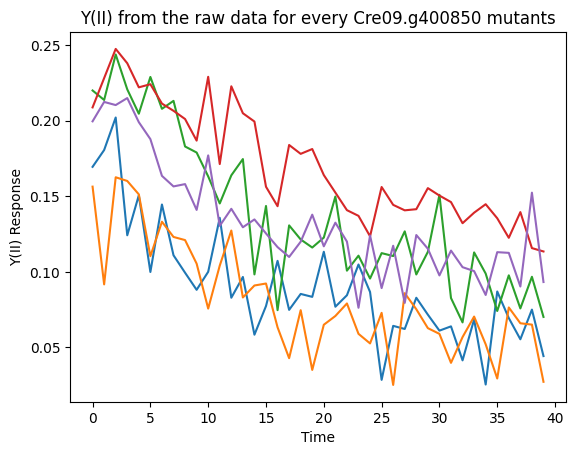

In [606]:
Data_analysis_func.plot_y2(data[(data['mutated_genes'] == data['mutated_genes'].unique()[7]) & (data['light_regime'] == '20h_HL')], title='Y(II) from the raw data for every Cre09.g400850 mutants')

In [4]:
data_norm_flagged['flag_y2'].value_counts()

NameError: name 'data_norm_flagged' is not defined

In [460]:
pd.set_option('display.max_rows', 8)

In [594]:
data_norm_flagged[data_norm_flagged['flag_y2'] == 'weird']['feature'].value_counts()/data_norm_flagged['feature'].value_counts()

feature
                                         0.083725
-                                        0.511278
-,CDS                                    0.403925
-,CDS,3'UTR                              0.298246
                                           ...   
intron,CDS/intron,3'UTR                       NaN
intron,MULTIPLE_SPLICE_VARIANTS          0.222222
intron,MULTIPLE_SPLICE_VARIANTS,5'UTR    0.583333
intron,MULTIPLE_SPLICE_VARIANTS,CDS      0.785714
Name: count, Length: 74, dtype: float64

In [6]:
pd.set_option('display.max_columns', 500)

In [548]:
intra_distance_for_WT = Genes_self_similarity_v2.get_intra_distance_for_WT(data_norm_flagged[data_norm_flagged['mutant_ID'] == 'WT'])

In [549]:
intra_distance_for_WT

,pairwise_distances_y2,pairwise_distances_ynpq,light_regime,plate
0,"[0.14438428597461317, 0.1383590031964544, 0.45...","[0.10485429782358895, 0.08415980065810519, 0.2...",10min-10min,1
1,"[0.11971455083879012, 0.0376734241819669, 0.15...","[0.018405587134475206, 0.02637130445413015, 0....",10min-10min,2
2,"[0.024454586587526084, 0.016094470091501334, 0...","[0.021043058357977838, 0.013257421372103825, 0...",10min-10min,3
3,"[0.27155798083679433, 0.05059074733558544, 0.1...","[0.3818846188621652, 0.028210102965940884, 0.3...",10min-10min,4
...,...,...,...,...
127,"[0.03394530656237449, 0.030886177071203447, 0....","[0.01979868430735804, 0.022747300352191968, 0....",30s-30s,21
128,"[0.02230023830759098, 0.025662067590205728, 0....","[0.029575205008245842, 0.031136526386276286, 0...",30s-30s,22
129,"[0.022176402201286693, 0.04530789005936353, 0....","[0.014272617559491219, 0.02960217305017321, 0....",30s-30s,23
130,"[0.07423336788158141, 0.06192363964549097, 0.0...","[0.04191701259666836, 0.04220831047866036, 0.0...",30s-30s,99


In [566]:
pairwise_distances_y2_WT = intra_distance_for_WT[intra_distance_for_WT['light_regime'] == '1min-1min']['pairwise_distances_y2'].values

In [564]:
import scipy.stats as stats

thresholds_y2_dict = {}
thresholds_ynpq_dict = {}
for light in data['light_regime'].unique():
    pairwise_distances_y2_WT_light = intra_distance_for_WT[(intra_distance_for_WT['light_regime'] == light)]['pairwise_distances_y2'].values
    pairwise_distances_ynpq_WT_light = intra_distance_for_WT[(intra_distance_for_WT['light_regime'] == light)]['pairwise_distances_ynpq'].values
    pairwise_distances_y2_WT_light_flat = [item for sublist in pairwise_distances_y2_WT_light for item in sublist]
    pairwise_distances_ynpq_WT_light_flat = [item for sublist in pairwise_distances_ynpq_WT_light for item in sublist]
    mean, cov = Outlier_detection_v2.mean_cov_y2_WT_v2(data_norm_flagged, light, plot=False)
    n_samples = len(pairwise_distances_y2_WT_light_flat)

    # Compare the empirical distribution with the theoretical distribution using KS test
    # Theoretical distribution is generalized chi-squared, let's approximate it

    # Eigenvalues of the covariance matrix
    eigenvalues = np.linalg.eigvals(cov)

    # Generate random variables from a generalized chi-squared distribution
    theoretical_norms = np.sum([np.random.chisquare(1, n_samples) * eigenvalue for eigenvalue in eigenvalues], axis=0)

    # Perform the KS test
    ks_stat, p_value = stats.ks_2samp(norms, theoretical_norms)

    # Print the results
    print(f"KS Statistic: {ks_stat}")
    print(f"P-value: {p_value}")

    # Plot the empirical and theoretical distributions
    plt.hist(norms, bins=30, density=True, alpha=0.5, label='Empirical Norms')
    plt.hist(theoretical_norms, bins=30, density=True, alpha=0.5, label='Theoretical Norms')
    plt.legend()
    plt.xlabel('Norms')
    plt.ylabel('Density')
    plt.title('Empirical vs Theoretical Distribution of Norms')
    plt.show()
    thresholds_y2_dict[light] = np.percentile(pairwise_distances_y2_WT_light_flat, 95)
    thresholds_ynpq_dict[light] = np.percentile(pairwise_distances_ynpq_WT_light_flat, 95)

In [565]:
thresholds_y2_dict

{'1min-1min': 0.20851837834800566,
 '10min-10min': 0.20553934840833996,
 '20h_HL': 0.09253736517923783,
 '20h_ML': 0.12435393486987634,
 '2h-2h': 0.09998663395503643,
 '30s-30s': 0.15529552464531887}

In [567]:
# flatten pairwise_distances_y2_WT
pairwise_distances_y2_WT_flat = [item for sublist in pairwise_distances_y2_WT for item in sublist]

Text(0.5, 1.0, 'Histogram of pairwise_distances_y2 for WT')

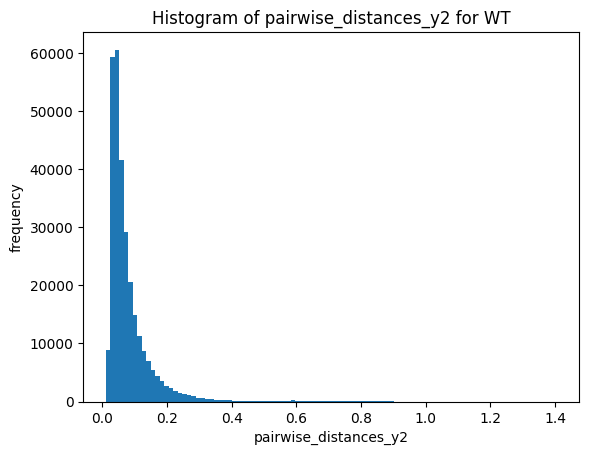

In [568]:
hist = plt.hist(pairwise_distances_y2_WT_flat, bins=100)
plt.xlabel('pairwise_distances_y2')
plt.ylabel('frequency')
plt.title('Histogram of pairwise_distances_y2 for WT')


In [555]:
mean_pairwise_distances_y2_WT = np.mean(pairwise_distances_y2_WT_flat)  

In [556]:
mean_pairwise_distances_y2_WT

0.037259045154579826

In [557]:
percentile_95_pairwise_distances_y2_WT = np.percentile(pairwise_distances_y2_WT_flat, 95)

In [558]:
percentile_95_pairwise_distances_y2_WT

0.09253736517923783

In [428]:
mean_intra_distance_WT = Genes_self_similarity_v2.get_mean_intra_distance(data[(data['mutant_ID'] == 'WT') & (data['plate'] != 99)])

In [429]:
mean_intra_distance_WT

,light_regime,mean_distance_y2,var_distance_y2,mean_distance_ynpq,var_distance_ynpq,sample_count
0,10min-10min,0.099940,0.010415,0.188994,0.044665,65
1,1min-1min,0.129713,0.010897,0.296654,0.300926,65
2,20h_HL,0.134752,0.022155,0.471945,0.475801,65
3,20h_ML,0.055365,0.002694,0.121319,0.029388,61
4,2h-2h,0.052883,0.001356,0.129823,0.022167,62
5,30s-30s,0.186987,0.033497,0.111819,0.020898,50


In [188]:
mean_intra_distance = Genes_self_similarity_v2.get_mean_intra_distance(data_norm_flagged)

In [189]:
mean_intra_distance

,light_regime,mean_distance_y2,var_distance_y2,mean_distance_ynpq,var_distance_ynpq,sample_count
0,10min-10min,0.241332,0.105961,0.266902,0.139369,9641
1,1min-1min,0.313890,0.191894,0.287685,0.136368,9671
2,20h_HL,0.121522,0.020510,0.484175,0.452129,9299
3,20h_ML,0.227433,0.106138,0.392054,0.813920,8827
4,2h-2h,0.157011,0.035022,0.236602,0.076885,8850
5,30s-30s,0.336962,0.242736,0.159094,0.048774,7235


In [430]:
mean_intra_distance_ok = Genes_self_similarity_v2.get_mean_intra_distance(data_norm_flagged[data_norm_flagged['flag_y2'] == 'ok'])

In [431]:
mean_intra_distance_ok

,light_regime,mean_distance_y2,var_distance_y2,mean_distance_ynpq,var_distance_ynpq,sample_count
0,10min-10min,0.174251,0.048024,0.237562,0.106717,5118
1,1min-1min,0.195751,0.055398,0.209043,0.076181,4714
2,20h_HL,0.090708,0.006770,0.515258,0.530425,6977
3,20h_ML,0.140252,0.031751,0.269030,0.261931,5444
4,2h-2h,0.101548,0.011350,0.172340,0.043573,6257
5,30s-30s,0.266480,0.139467,0.123640,0.029182,3836


In [7]:
data_with_std = Feature_engineering.get_std(data_norm_flagged)

NameError: name 'data_norm_flagged' is not defined

In [6]:
data_with_std 

NameError: name 'data_with_std' is not defined

In [3]:
# plot 'std_y2' as a function of 'mask_area' nicely

plt.scatter(data_with_std['mask_area'], data_with_std['std_y2'], s=1)
plt.xlabel('mask_area')
plt.ylabel('std_y2')
plt.title('std_y2 as a function of mask_area')
plt.show()

NameError: name 'data_with_std' is not defined

In [57]:
data_norm_flagged['feature'].value_counts().index[:10]

Index(['intron', 'CDS', 'MULTIPLE_SPLICE_VARIANTS', 'CDS,intron', 'intron,CDS',
       '-,intron', 'intergenic,intron', 'intron,3'UTR', '-,CDS', 'CDS,3'UTR'],
      dtype='object', name='feature')

In [81]:
feature_pdist = Genes_self_similarity_v2.get_avg_pairwise_distances_for_feature_combinations(data_norm_flagged)

In [172]:
feature_pdist_raw = Genes_self_similarity_v2.get_avg_pairwise_distances_for_feature_combinations(data)

In [187]:
# groupby light regime and average
feature_pdist[feature_pdist['light_regime'] == '1min-1min']['avg_inter_feature_distance_y2'].mean()

0.3764337615929273

In [59]:
feature_pdist[(feature_pdist['feature1'] == 'intron,CDS') & (feature_pdist['feature2'] == 'CDS,intron')]

,avg_inter_feature_distance_y2,avg_inter_feature_distance_ynpq,sample_count,mutated_genes,light_regime,feature1,feature2
127,0.373318,0.191415,7,Cre01.g002861,10min-10min,"intron,CDS","CDS,intron"
142,0.400211,0.031897,7,Cre01.g002861,1min-1min,"intron,CDS","CDS,intron"
157,0.053914,0.484323,7,Cre01.g002861,20h_HL,"intron,CDS","CDS,intron"
168,0.152865,0.091565,5,Cre01.g002861,20h_ML,"intron,CDS","CDS,intron"
182,0.075679,0.170534,7,Cre01.g002861,2h-2h,"intron,CDS","CDS,intron"
...,...,...,...,...,...,...,...
58520,0.108382,0.036867,3,Cre17.g741350,10min-10min,"intron,CDS","CDS,intron"
58526,0.028871,0.021275,3,Cre17.g741350,1min-1min,"intron,CDS","CDS,intron"
58532,0.016344,0.055495,3,Cre17.g741350,20h_HL,"intron,CDS","CDS,intron"
58538,0.026591,0.010911,3,Cre17.g741350,20h_ML,"intron,CDS","CDS,intron"


In [54]:
feature_pdist[(feature_pdist['feature2'] == 'CDS,intron')]

,avg_inter_feature_distance_y2,avg_inter_feature_distance_ynpq,sample_count,mutated_genes,light_regime,feature1,feature2
0,0.000000,0.000000,2,Cre01.g000100,10min-10min,"CDS,intron","CDS,intron"
1,0.041114,1.227259,2,Cre01.g000100,10min-10min,"intron,CDS,3'UTR","CDS,intron"
3,0.000000,0.000000,2,Cre01.g000100,1min-1min,"CDS,intron","CDS,intron"
4,0.196139,0.617700,2,Cre01.g000100,1min-1min,"intron,CDS,3'UTR","CDS,intron"
6,0.000000,0.000000,2,Cre01.g000100,20h_HL,"CDS,intron","CDS,intron"
...,...,...,...,...,...,...,...
58964,0.000000,0.000000,2,Cre36.g759697,1min-1min,"CDS,intron","CDS,intron"
58967,0.000000,0.000000,2,Cre36.g759697,20h_HL,"CDS,intron","CDS,intron"
58970,0.000000,0.000000,2,Cre36.g759697,20h_ML,"CDS,intron","CDS,intron"
58973,0.000000,0.000000,2,Cre36.g759697,2h-2h,"CDS,intron","CDS,intron"


In [83]:
def plot_avg_distances(df, features):
    # Filter the DataFrame for the selected features
    filtered_df = df[(df['feature1'].isin(features)) & (df['feature2'].isin(features))]

    # Summarize the DataFrame to get the average distances for each feature combination
    summarized_df = filtered_df.groupby(['feature1', 'feature2']).agg({
        'avg_inter_feature_distance_y2': 'mean',
        'avg_inter_feature_distance_ynpq': 'mean'
    }).reset_index()

    # Create a new column for the combined feature labels
    summarized_df['feature_combination'] = summarized_df['feature1'] + '-' + summarized_df['feature2']

    # Determine the existing feature combinations in the summarized DataFrame
    existing_combinations = summarized_df['feature_combination'].unique()

    # Determine the custom order for the feature combinations
    same_feature_combinations = [f"{feature}-{feature}" for feature in features if f"{feature}-{feature}" in existing_combinations]
    different_feature_combinations = [f"{f1}-{f2}" for f1 in features for f2 in features if f1 != f2 and f"{f1}-{f2}" in existing_combinations]
    custom_order = same_feature_combinations + different_feature_combinations

    # Ensure the order is respected in the plot
    summarized_df['feature_combination'] = pd.Categorical(summarized_df['feature_combination'], categories=custom_order, ordered=True)

    # Sort the DataFrame based on the custom order
    summarized_df = summarized_df.sort_values('feature_combination')

    # Plot the average distances for 'y2_' and 'ynpq_'
    fig, axes = plt.subplots(1, 2, figsize=(16, 8), sharey=True)

    sns.barplot(data=summarized_df, x='feature_combination', y='avg_inter_feature_distance_y2', ax=axes[0])
    axes[0].set_title('Average Pairwise Distances (y2)')
    axes[0].set_xlabel('Feature Combination')
    axes[0].set_ylabel('Average Distance')

    axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha='right')

    sns.barplot(data=summarized_df, x='feature_combination', y='avg_inter_feature_distance_ynpq', ax=axes[1])
    axes[1].set_title('Average Pairwise Distances (ynpq)')
    axes[1].set_xlabel('Feature Combination')
    axes[1].set_ylabel('Average Distance')

    axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha='right')

    plt.tight_layout()
    plt.show()


In [120]:
def plot_distances_box(df, features):
    # Filter the DataFrame for the selected features
    filtered_df = df[(df['feature1'].isin(features)) & (df['feature2'].isin(features))]

    # Create a new column for the combined feature labels
    filtered_df['feature_combination'] = filtered_df['feature1'] + '-' + filtered_df['feature2']

    # Determine the existing feature combinations in the summarized DataFrame
    existing_combinations = filtered_df['feature_combination'].unique()

    # Determine the custom order for the feature combinations
    same_feature_combinations = [f"{feature}-{feature}" for feature in features if f"{feature}-{feature}" in existing_combinations]
    different_feature_combinations = [f"{f1}-{f2}" for f1 in features for f2 in features if f1 != f2 and f"{f1}-{f2}" in existing_combinations]
    custom_order = same_feature_combinations + different_feature_combinations

    # Ensure the order is respected in the plot
    filtered_df['feature_combination'] = pd.Categorical(filtered_df['feature_combination'], categories=custom_order, ordered=True)

    # Sort the DataFrame based on the custom order
    filtered_df = filtered_df.sort_values('feature_combination')

    # Plot the average distances for 'y2_' and 'ynpq_' using swarm plot
    fig, axes = plt.subplots(1, 2, figsize=(16, 8), sharey=True)

    sns.boxplot(data=filtered_df, x='feature_combination', y='avg_inter_feature_distance_y2', order=custom_order, ax=axes[0])
    # axes[0].set_title('Average Pairwise Distances (y2)')
    axes[0].set_xlabel('Feature Combination')
    axes[0].set_ylabel('Average Distance')
    axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha='right')

    sns.boxplot(data=filtered_df, x='feature_combination', y='avg_inter_feature_distance_ynpq', order=custom_order, ax=axes[1])
    # axes[1].set_title('Average Pairwise Distances (ynpq)')
    axes[1].set_xlabel('Feature Combination')
    axes[1].set_ylabel('Average Distance')

    # Annotate the number of distances in each box plot
    for ax, column in zip(axes, ['avg_inter_feature_distance_y2', 'avg_inter_feature_distance_ynpq']):
        for tick, label in zip(ax.get_xticks(), ax.get_xticklabels()):
            feature_combination = label.get_text()
            count = filtered_df[filtered_df['feature_combination'] == feature_combination].dropna().shape[0]
            ax.text(tick, ax.get_ylim()[1], f'{count}', ha='center', va='bottom', fontsize=10, color='black', weight='bold', rotation=45)

    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

/var/folders/1m/j6l58hd9755c0h_89l4yckhw0000gn/T/ipykernel_58695/2263073939.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['feature_combination'] = filtered_df['feature1'] + '-' + filtered_df['feature2']
/var/folders/1m/j6l58hd9755c0h_89l4yckhw0000gn/T/ipykernel_58695/2263073939.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['feature_combination'] = pd.Categorical(filtered_df['feature_combination'], categories=custom_order, ordered=True)
/var/folders/1m/j6l58hd9755c0h_89l4

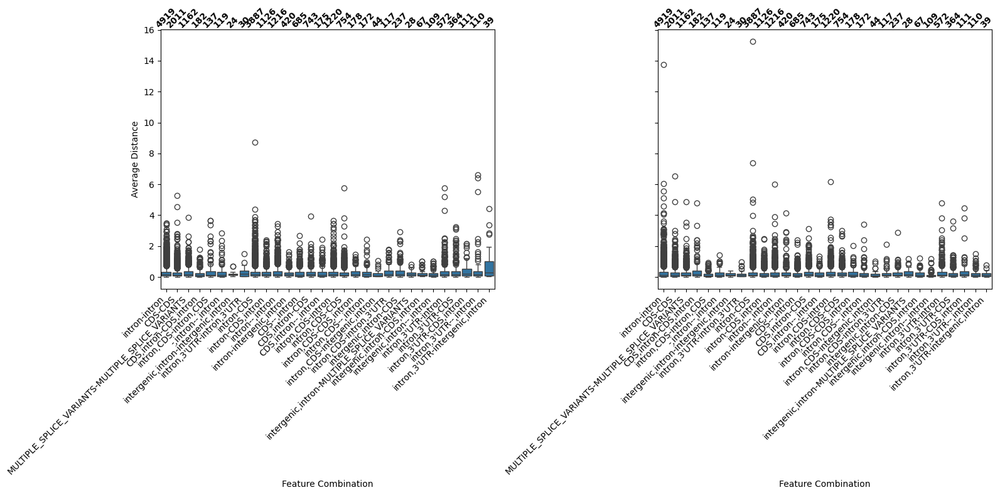

In [121]:
features = data_norm_flagged['feature'].value_counts().index[:8]
plot_distances_box(feature_pdist, features)

In [194]:
pdist(data_norm_flagged[data_norm_flagged['mutant_ID'] == 'WT'].iloc[:3].filter(like='y2_').dropna(axis=1).values, metric=Genes_self_similarity_v2.distance_metric)

array([0.04431524, 0.07017744, 0.05086188])

/var/folders/1m/j6l58hd9755c0h_89l4yckhw0000gn/T/ipykernel_58695/3798950095.py:36: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha='right')
/var/folders/1m/j6l58hd9755c0h_89l4yckhw0000gn/T/ipykernel_58695/3798950095.py:43: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha='right')


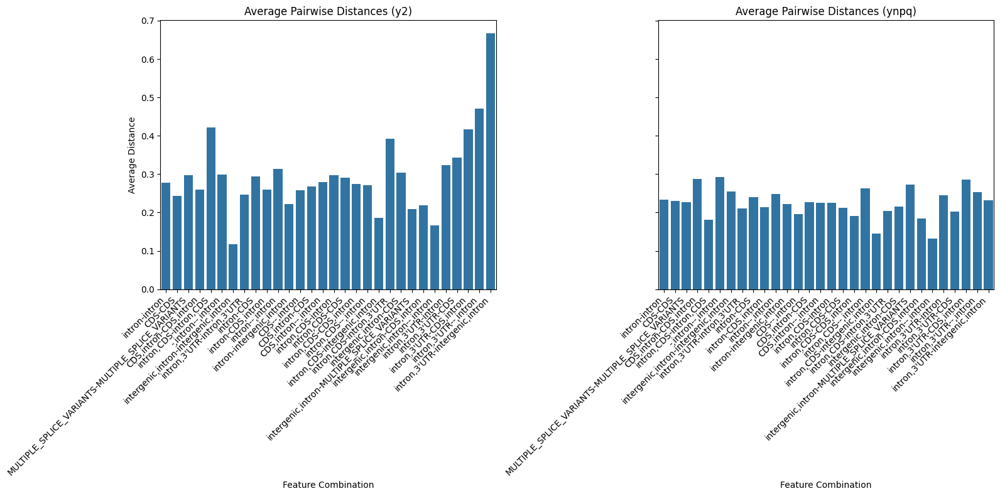

In [173]:
features = data_norm_flagged['feature'].value_counts().index[:8]
plot_avg_distances(feature_pdist_raw, features)

In [277]:
Outlier_detection_v2.detect_diverging_outliers(data_norm_flagged, alpha=0.05, p=(1/2), w=10)
Outlier_detection_v2.detect_outlier_mean_reduced_v2(data_norm_flagged, alpha=0.05)

/Users/samsongourevitch/Documents/Chlamy_Project_Github/Chlamy_project/Outlier_detection_v2.py:601: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, False, 

In [7]:
data_smoothed = Data_v2.get_smooth_data(data_norm_flagged, method='local')

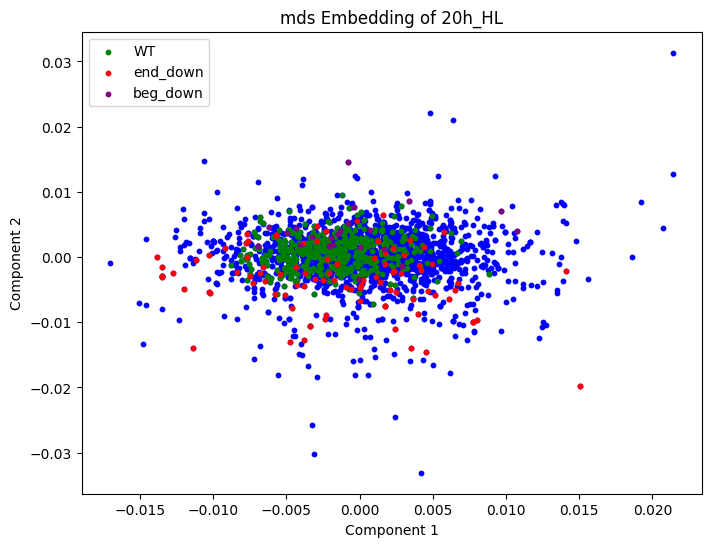

In [24]:
feature_red_1min = Clusters.dim_reduc(data_smoothed, method='mds', light_regime='1min-1min', metric=Clusters.dtw_grad_distance, n_components=2, n_samples=2000)

In [2]:
n_archetypes = 4

# Perform AA
aa = AA(n_archetypes)
aa.fit(feature_red_1min)
archetypes = aa.archetypes_

# Step 3: Plot the 2D data points and archetypes
plt.figure(figsize=(10, 7))
plt.scatter(feature_red_1min[:, 0], feature_red_1min[:, 1], label='Data points')
plt.scatter(archetypes[:, 0], archetypes[:, 1], color='red', label='Archetypes')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.title('Archetypal Analysis on 2D Data')
plt.legend()
plt.show()

NameError: name 'AA' is not defined

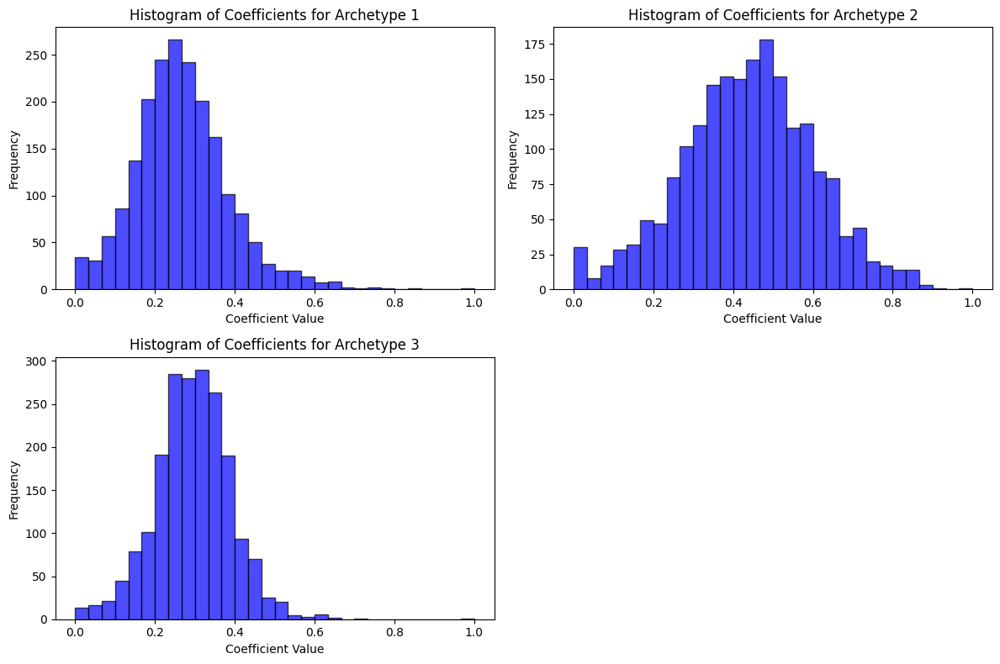

In [58]:
# plot a histogram of the coefficents of the points as convex combinations of the archetypes
coefficients = aa.transform(feature_red_1min)
# Number of archetypes
n_archetypes = coefficients.shape[1]

# Plot histograms for each archetype
plt.figure(figsize=(12, 8))

for i in range(n_archetypes):
    plt.subplot(2, 2, i + 1)  # Adjust the subplot grid as needed
    plt.hist(coefficients[:, i], bins=30, alpha=0.7, color='blue', edgecolor='black')
    plt.title(f'Histogram of Coefficients for Archetype {i + 1}')
    plt.xlabel('Coefficient Value')
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

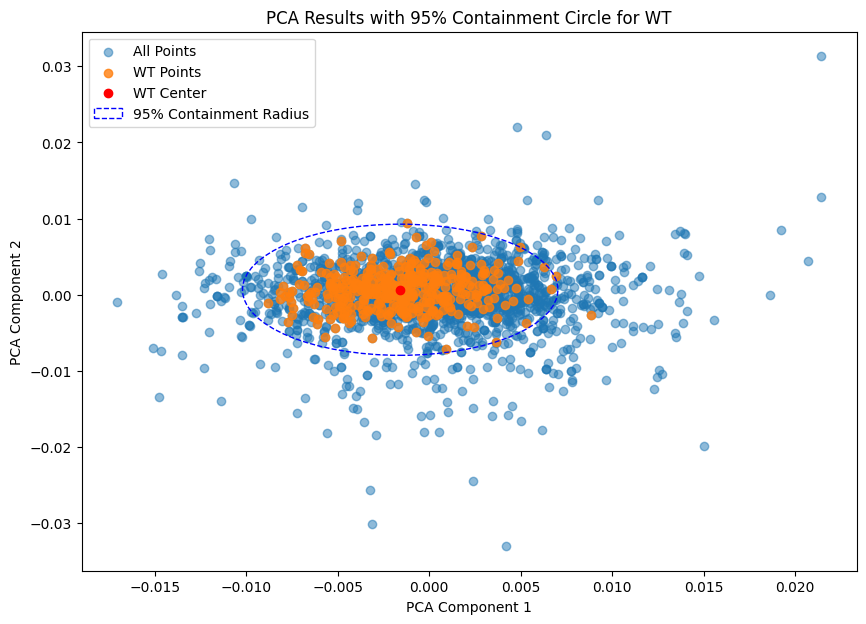

In [59]:
data_smoothed_HL = data_smoothed[data_smoothed['light_regime'] == '1min-1min'].iloc[:2000].reset_index(drop=True)

data_smoothed_HL['mds_1'] = feature_red_1min[:, 0]
data_smoothed_HL['mds_2'] = feature_red_1min[:, 1]

# plot the associated y2 ts to the archetypes
features_HL = data_smoothed[data_smoothed['light_regime'] == '1min-1min'].iloc[:2000].filter(like='y2_').dropna(axis=1).values

wt_points = data_smoothed_HL[data_smoothed_HL['mutant_ID'] == 'WT'][['mds_1', 'mds_2']]
wt_center = wt_points.mean().values
wt_distances = np.linalg.norm(wt_points.values - wt_center, axis=1)
radius = np.percentile(wt_distances, 99)

# Plotting the points and the circle
plt.figure(figsize=(10, 7))
plt.scatter(data_smoothed_HL['mds_1'], data_smoothed_HL['mds_2'], label='All Points', alpha=0.5)
plt.scatter(wt_points['mds_1'], wt_points['mds_2'], label='WT Points', alpha=0.8)
plt.scatter(wt_center[0], wt_center[1], color='red', label='WT Center')

# Add a circle to represent the 95% containment radius
circle = plt.Circle(wt_center, radius, color='blue', fill=False, linestyle='--', label='95% Containment Radius')
plt.gca().add_patch(circle)

plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend()
plt.title('PCA Results with 95% Containment Circle for WT')
plt.show()

In [130]:
from collections import defaultdict

# distances_to_wt_center = np.linalg.norm(archetypes - wt_center, axis=1)
# distances_to_ball_edge = distances_to_wt_center - radius
# # Get the 10 closest data points to each archetype
# closest_points_list = []
# for i, archetype in enumerate(archetypes):
#     distances = np.linalg.norm(feature_red_1min - archetype, axis=1)
#     # append the idx of the points that have distance less than distances_to_ball_edge[i]
#     closest_points = np.where(distances < distances_to_ball_edge[i])[0]
#     closest_points_list.append(closest_points)
    
distances_to_wt_center = np.linalg.norm(data_smoothed_HL[['mds_1', 'mds_2']].values - wt_center, axis=1)

# # Identify points outside the WT circle
# points_outside_circle = data_smoothed_HL[distances_to_wt_center > radius]
# points_inside_circle = data_smoothed_HL[distances_to_wt_center <= radius]

# # Initialize the list to store closest points for each archetype
# closest_points_list = defaultdict(list)

# # Assign each point outside the WT circle to the closest archetype
# for idx, point in points_outside_circle.iterrows():
#     point_coords = point[['mds_1', 'mds_2']].values.astype(float)
#     distances_to_archetypes = np.linalg.norm(archetypes - point_coords, axis=1)
#     closest_archetype_index = np.argmin(distances_to_archetypes)
#     closest_points_list[closest_archetype_index].append(idx)

# Initialize the list to store closest points for each archetype
closest_points_list = defaultdict(list)

for idx, point_coords in enumerate(data_smoothed_HL[['mds_1', 'mds_2']].values):
    point_vector = point_coords - wt_center
    if np.linalg.norm(point_vector) <= radius:
        data_smoothed_HL.loc[idx, 'shape_cluster'] = 0
    else :
        closest_archetype_index = None
        closest_distance = np.inf

        # Check each archetype to see if the point is in front and find the closest one
        for i, archetype in enumerate(archetypes):
            archetype_vector = archetype - wt_center
            dot_product = np.dot(point_vector, archetype_vector)

            # Check if point is in front of the WT circle relative to the archetype
            if dot_product > 0:
                distance_to_archetype = np.linalg.norm(point_coords - archetype)
                if distance_to_archetype < closest_distance:
                    closest_distance = distance_to_archetype
                    closest_archetype_index = i

        if closest_archetype_index is not None:
            closest_points_list[closest_archetype_index].append(idx)
            data_smoothed_HL.loc[idx, 'shape_cluster'] = closest_archetype_index + 1

closest_points_list = [closest_points_list[i] for i in range(len(archetypes))]

# # Function to calculate the angle of each point relative to the center
# def calculate_angle(x, y, center_x, center_y):
#     return np.degrees(np.arctan2(y - center_y, x - center_x)) % 360

# # Calculate the angle for each point
# data_smoothed_HL['angle'] = data_smoothed_HL.apply(lambda row: calculate_angle(row['mds_1'], row['mds_2'], wt_center[0], wt_center[1]), axis=1)

# # Define the number of sectors
# num_sectors = 4
# sector_size = 360 / num_sectors

# # Function to assign sector based on angle
# def assign_sector(angle, num_sectors, sector_size):
#     return int(angle // sector_size) + 1

# # Assign each point to a sector
# data_smoothed_HL['shape_cluster'] = data_smoothed_HL['angle'].apply(lambda angle: assign_sector(angle, num_sectors, sector_size))
# for idx, point_coords in enumerate(data_smoothed_HL[['mds_1', 'mds_2']].values):
#     point_vector = point_coords - wt_center
#     if np.linalg.norm(point_vector) <= radius:
#         data_smoothed_HL.loc[idx, 'shape_cluster'] = 0

colors = ['green', 'cyan', 'red', 'yellow', 'purple']
plt.figure(figsize=(8, 8))
# # Plot closest points and circles for each archetype
# plt.scatter(data_smoothed_HL['mds_1'], data_smoothed_HL['mds_2'], s=6)
# for i, archetype in enumerate(archetypes):
#     closest_points = closest_points_list[i]
#     plt.scatter(data_smoothed_HL['mds_1'].iloc[closest_points], data_smoothed_HL['mds_2'].iloc[closest_points], color=colors[i], alpha=0.6, label=f'Closest Points to Archetype {i}', s=6)
#     # plt.scatter(points_outside_circle['mds_1'].iloc[closest_points], points_outside_circle['mds_2'].iloc[closest_points], color=colors[i], alpha=0.6, label=f'Closest Points to Archetype {i}', s=6)
#     plt.scatter(archetypes[i, 0], archetypes[i, 1], color=colors[i], label='Archetypes')
#     # archetype_circle = plt.Circle(archetype, distances_to_ball_edge[i], color=colors[i], fill=False, linestyle='--')
#     # plt.gca().add_patch(archetype_circle)

# plot each shape cluster
for i in range(len(data_smoothed_HL['shape_cluster'].unique())):
    data_cluster = data_smoothed_HL[data_smoothed_HL['shape_cluster'] == i]
    plt.scatter(data_cluster['mds_1'], data_cluster['mds_2'], color=colors[i], alpha=0.6, label=f'Cluster {i}', s=6)

# plt.scatter(wt_points['mds_1'], wt_points['mds_2'], label='WT Points', color='green', alpha=0.6, s=6)
circle = plt.Circle(wt_center, radius, color='blue', fill=False, linestyle='--', label='95% Containment Radius')
plt.gca().add_patch(circle)

plt.scatter(archetypes[:, 0], archetypes[:, 1], color='purple', label='Archetypes', s=50)

plt.xlabel('MDS Component 1')
plt.ylabel('MDS Component 2')
plt.xlim(-0.05, 0.05)
plt.ylim(-0.05, 0.05)
# plt.legend()
plt.title('MDS Results with Archetypes, WT Containment Circle, and Closest Points')
plt.show()

NameError: name 'data_smoothed_HL' is not defined

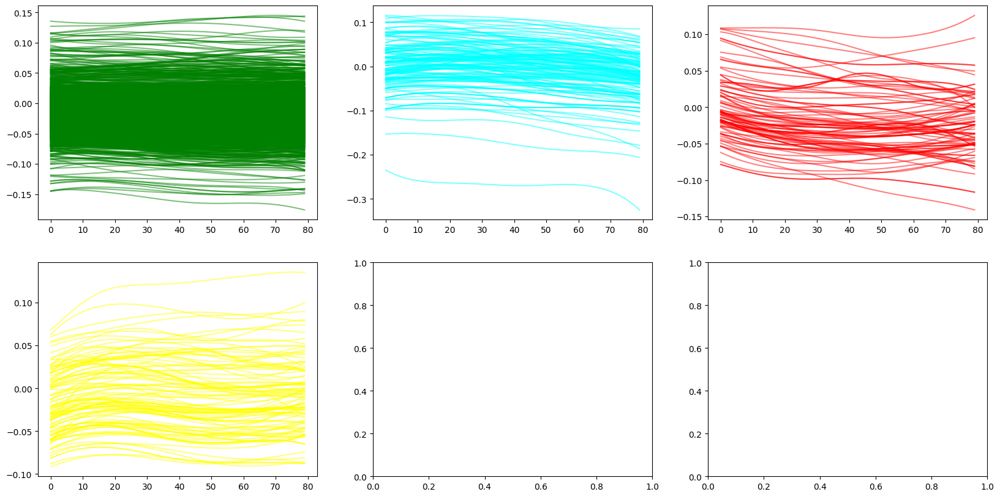

In [62]:
from collections import Counter

# all_points = [point for sublist in closest_points_list for point in sublist]

# # Count the occurrences of each point
# point_counts = Counter(all_points)

# # Filter the elements that appear exactly once
# unique_points = [point for point, count in point_counts.items() if count == 1]

# # Now we need to separate these unique points back into their respective closest_points_list
# filtered_closest_points_list = []
# for sublist in closest_points_list:
#     filtered_sublist = [point for point in sublist if point_counts[point] == 1]
#     filtered_closest_points_list.append(filtered_sublist)

# closest_points_list = [i for sublist in closest_points for i in sublist]

# Plot the closest time series to each archetype
plt.subplots(2, 3, figsize=(20, 10))
# for i, closest_points in enumerate(closest_points_list):
#     for closest_point in closest_points:
#         plt.subplot(2, 3, i+1)
#         # plt.plot(data_smoothed_HL.iloc[closest_point].filter(like='y2_').values, c=colors[i], alpha=0.5)
#         plt.plot(points_outside_circle.iloc[closest_point].filter(like='y2_').values, c=colors[i], alpha=0.5)
#     plt.title(f'Closest Time Series to Archetype {i}')
#     plt.xlabel('Time')
#     plt.ylabel('Y2')

for i in range(len(data_smoothed_HL['shape_cluster'].unique())):
    data_cluster = data_smoothed_HL[data_smoothed_HL['shape_cluster'] == i]
    for idx in data_cluster.index:
        plt.subplot(2, 3, i+1)
        plt.plot(data_cluster.loc[idx].filter(like='y2_').values, c=colors[i], alpha=0.5)

# plt.subplot(2, 3, 5)
# plt.plot(points_inside_circle.filter(like='y2_').values.T, c='green', alpha=0.5)
# plt.title('Closest Time Series to Archetypes')
# plt.xlabel('Time')
# plt.ylabel('Y2')
# plt.legend()
plt.show()

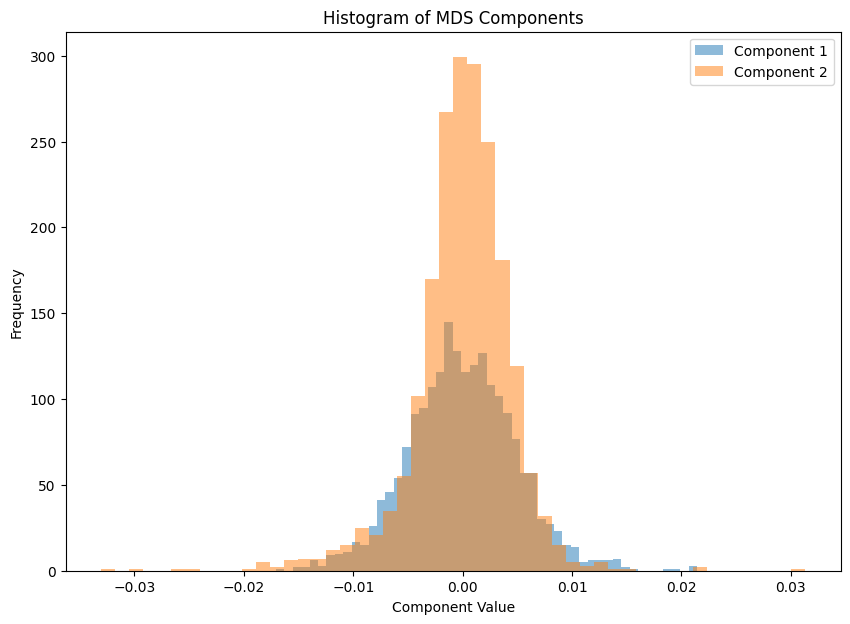

In [51]:
# plot a hist of mds_1 and mds_2 for the data
plt.figure(figsize=(10, 7))
plt.hist(data_smoothed_HL['mds_1'], bins=50, alpha=0.5, label='Component 1')
plt.hist(data_smoothed_HL['mds_2'], bins=50, alpha=0.5, label='Component 2')
plt.xlabel('Component Value')
plt.ylabel('Frequency')
plt.title('Histogram of MDS Components')
plt.legend()
plt.show()


In [ ]:
feature_red_HL = Clusters.dim_reduc(data_smoothed, method='mds', metric=Clusters.grad_distance, n_components=2, light='20h_HL', n_samples=3000)

aa = AA(n_archetypes)
aa.fit(feature_red)
archetypes = aa.archetypes_

closest_points_list = defaultdict(list)

for idx, point_coords in enumerate(data_smoothed_HL[['mds_1', 'mds_2']].values):
    point_vector = point_coords - wt_center
    if np.linalg.norm(point_vector) <= radius:
        data_smoothed_HL.loc[idx, 'shape_cluster'] = 0
    else :
        closest_archetype_index = None
        closest_distance = np.inf

        # Check each archetype to see if the point is in front and find the closest one
        for i, archetype in enumerate(archetypes):
            archetype_vector = archetype - wt_center
            dot_product = np.dot(point_vector, archetype_vector)

            # Check if point is in front of the WT circle relative to the archetype
            if dot_product > 0:
                distance_to_archetype = np.linalg.norm(point_coords - archetype)
                if distance_to_archetype < closest_distance:
                    closest_distance = distance_to_archetype
                    closest_archetype_index = i

        if closest_archetype_index is not None:
            closest_points_list[closest_archetype_index].append(idx)
            data_smoothed_HL.loc[idx, 'shape_cluster'] = closest_archetype_index + 1

# create three mean_clusters, one for mean below 95% of the WT mean_y2, one for mean above 95% of the WT mean_y2 and one for the rest
mean_y2_WT = data_smoothed_HL[data_smoothed_HL['mutant_ID'] == 'WT']['mean_y2'].values
# get an interval where 95% of the WT are
wt_mean = data_smoothed_HL[data_smoothed_HL['mutant_ID'] == 'WT']['mean_y2'].values

# get the 95% interval
interval = np.percentile(wt_mean, [2.5, 97.5])

data_smoothed_HL['mean_cluster'] = 0

for idx in data_smoothed_HL.index:
    if data_smoothed_HL.loc[idx, 'mean_y2'] < interval[0]:
        data_smoothed_HL.loc[idx, 'mean_cluster'] = 1
    elif data_smoothed_HL.loc[idx, 'mean_y2'] >= interval[1]:
        data_smoothed_HL.loc[idx, 'mean_cluster'] = 2

In [49]:
archetypes_dict = {}

data_smooth_cluster = pd.DataFrame()

for light in data_smoothed['light_regime'].unique():
    data_smoothed_light = data_smoothed[data_smoothed['light_regime'] == light].reset_index(drop=True)
    feature_red_light = Clusters.dim_reduc(data_smoothed, method='mds', light_regime=light, metric=Clusters.dtw_grad_distance, n_components=2, n_samples=30000, plot=False)
    data_smoothed_light['mds_1'] = feature_red_light[:, 0]
    data_smoothed_light['mds_2'] = feature_red_light[:, 1]

    # plot the associated y2 ts to the archetypes
    features_light = data_smoothed_light.filter(like='y2_').dropna(axis=1).values

    wt_points = data_smoothed_light[data_smoothed_light['mutant_ID'] == 'WT'][['mds_1', 'mds_2']]
    wt_center = wt_points.mean().values
    wt_distances = np.linalg.norm(wt_points.values - wt_center, axis=1)
    radius = np.percentile(wt_distances, 99)
    n_archetypes = 4
    aa = AA(n_archetypes)
    aa.fit(feature_red_light)
    archetypes = aa.archetypes_
    archetypes_dict[light] = archetypes

    data_smoothed_light = set_sector_group(data_smoothed_light, wt_center, radius)
    data_smoothed_light = set_mean_group(data_smoothed_light)

    data_smooth_cluster = pd.concat([data_smooth_cluster, data_smoothed_light])

    

KeyboardInterrupt: 

In [13]:
def set_mean_group(data):
    data_copy = data.copy()
    # get an interval where 95% of the WT are
    wt_mean_y2 = data_copy[data_copy['mutant_ID'] == 'WT']['mean_y2'].values
    wt_mean_ynpq = data_copy[data_copy['mutant_ID'] == 'WT']['mean_ynpq'].values

    # get the 95% interval
    interval_y2 = np.percentile(wt_mean_y2, [2.5, 97.5])
    interval_ynpq = np.percentile(wt_mean_ynpq, [2.5, 97.5])

    data_copy['mean_cluster_y2'] = 0
    data_copy['mean_cluster_ynpq'] = 0

    for idx in data_copy.index:
        if data_copy.loc[idx, 'mean_y2'] < interval_y2[0]:
            data_copy.loc[idx, 'mean_cluster_y2'] = -1
        elif data_copy.loc[idx, 'mean_y2'] >= interval_y2[1]:
            data_copy.loc[idx, 'mean_cluster_y2'] = 1
        
        if data_copy.loc[idx, 'mean_ynpq'] < interval_ynpq[0]:
            data_copy.loc[idx, 'mean_cluster_ynpq'] = -1
        elif data_copy.loc[idx, 'mean_ynpq'] >= interval_ynpq[1]:
            data_copy.loc[idx, 'mean_cluster_ynpq'] = 1

    return data_copy

In [37]:
def set_sector_group(data, wt_center, radius):
    data_copy = data.copy()
    # Calculate the angle for each point
    data_copy['angle'] = data_copy.apply(lambda row: calculate_angle(row['mds_1'], row['mds_2'], wt_center[0], wt_center[1]), axis=1)

    # Define the number of sectors
    num_sectors = 4
    sector_size = 360 / num_sectors

    # Assign each point to a sector
    data_copy['shape_cluster'] = data_copy['angle'].apply(lambda angle: assign_sector(angle, num_sectors, sector_size))
    for idx, point_coords in enumerate(data_copy[['mds_1', 'mds_2']].values):
        point_vector = point_coords - wt_center
        if np.linalg.norm(point_vector) <= radius:
            data_copy.loc[idx, 'shape_cluster'] = 0

    return data_copy

In [38]:
def set_closest_archetype(data, archetypes, wt_center, radius):
    data_copy = data.copy().reset_index(drop=True)
    closest_points_list = defaultdict(list)

    for idx, point_coords in enumerate(data_copy[['mds_1', 'mds_2']].values):
        point_vector = point_coords - wt_center
        if np.linalg.norm(point_vector) <= radius:
            data_copy.loc[idx, 'shape_cluster'] = 0
        else :
            closest_archetype_index = None
            closest_distance = np.inf

            # Check each archetype to see if the point is in front and find the closest one
            for i, archetype in enumerate(archetypes):
                archetype_vector = archetype - wt_center
                dot_product = np.dot(point_vector, archetype_vector)

                # Check if point is in front of the WT circle relative to the archetype
                if dot_product > 0:
                    distance_to_archetype = np.linalg.norm(point_coords - archetype)
                    if distance_to_archetype < closest_distance:
                        closest_distance = distance_to_archetype
                        closest_archetype_index = i

            if closest_archetype_index is not None:
                closest_points_list[closest_archetype_index].append(idx)
                data_copy.loc[idx, 'shape_cluster'] = closest_archetype_index + 1

    return data_copy

In [41]:
data_slopes = Feature_engineering.get_slope(data_norm_flagged)

In [52]:
data_cluster = pd.DataFrame()

for light in data_slopes['light_regime'].unique():
    data_light = data_slopes[data_slopes['light_regime'] == light].reset_index(drop=True)
    slope_1_y2_WT = data_slopes[(data_slopes['light_regime'] == light) & (data_slopes['mutant_ID'] == 'WT')]['slope_1_y2'].values
    interval_1_y2 = np.percentile(slope_1_y2_WT, [0.5, 99.5])
    slope_2_y2_WT = data_slopes[(data_slopes['light_regime'] == light) & (data_slopes['mutant_ID'] == 'WT')]['slope_2_y2'].values
    interval_2_y2 = np.percentile(slope_2_y2_WT, [0.5, 99.5])
    slope_1_ynpq_WT = data_slopes[(data_slopes['light_regime'] == light) & (data_slopes['mutant_ID'] == 'WT')]['slope_1_ynpq'].values
    interval_1_ynpq = np.percentile(slope_1_ynpq_WT, [0.5, 99.5])
    slope_2_ynpq_WT = data_slopes[(data_slopes['light_regime'] == light) & (data_slopes['mutant_ID'] == 'WT')]['slope_2_ynpq'].values
    interval_2_ynpq = np.percentile(slope_2_ynpq_WT, [0.5, 99.5])

    slope_y2_WT = data_slopes[(data_slopes['light_regime'] == light) & (data_slopes['mutant_ID'] == 'WT')]['slope_y2'].values
    interval_y2 = np.percentile(slope_y2_WT, [0.5, 99.5])
    slope_ynpq_WT = data_slopes[(data_slopes['light_regime'] == light) & (data_slopes['mutant_ID'] == 'WT')]['slope_ynpq'].values
    interval_ynpq = np.percentile(slope_ynpq_WT, [0.5, 99.5])

    data_light['slope_cluster_1_y2'] = 0
    data_light['slope_cluster_2_y2'] = 0
    data_light['slope_cluster_1_ynpq'] = 0
    data_light['slope_cluster_2_ynpq'] = 0

    data_light['slope_cluster_y2'] = 0
    data_light['slope_cluster_ynpq'] = 0

    for idx in data_light.index:
        if data_light.loc[idx, 'slope_1_y2'] < interval_1_y2[0]:
            data_light.loc[idx, 'slope_cluster_1_y2'] = -1
        elif data_light.loc[idx, 'slope_1_y2'] >= interval_1_y2[1]:
            data_light.loc[idx, 'slope_cluster_1_y2'] = 1

        if data_light.loc[idx, 'slope_2_y2'] < interval_2_y2[0]:
            data_light.loc[idx, 'slope_cluster_2_y2'] = -1
        elif data_light.loc[idx, 'slope_2_y2'] >= interval_2_y2[1]:
            data_light.loc[idx, 'slope_cluster_2_y2'] = 1
        
        if data_light.loc[idx, 'slope_1_ynpq'] < interval_1_ynpq[0]:
            data_light.loc[idx, 'slope_cluster_1_ynpq'] = -1
        elif data_light.loc[idx, 'slope_1_ynpq'] >= interval_1_ynpq[1]:
            data_light.loc[idx, 'slope_cluster_1_ynpq'] = 1

        if data_light.loc[idx, 'slope_2_ynpq'] < interval_2_ynpq[0]:
            data_light.loc[idx, 'slope_cluster_2_ynpq'] = -1
        elif data_light.loc[idx, 'slope_2_ynpq'] >= interval_2_ynpq[1]:
            data_light.loc[idx, 'slope_cluster_2_ynpq'] = 1

        if data_light.loc[idx, 'slope_y2'] < interval_1_y2[0]:
            data_light.loc[idx, 'slope_cluster_y2'] = -1
        elif data_light.loc[idx, 'slope_y2'] >= interval_1_y2[1]:
            data_light.loc[idx, 'slope_cluster_y2'] = 1
        
        if data_light.loc[idx, 'slope_ynpq'] < interval_1_ynpq[0]:
            data_light.loc[idx, 'slope_cluster_ynpq'] = -1
        elif data_light.loc[idx, 'slope_ynpq'] >= interval_1_ynpq[1]:
            data_light.loc[idx, 'slope_cluster_ynpq'] = 1


    data_light = set_mean_group(data_light)

    data_cluster = pd.concat([data_cluster, data_light])

In [94]:
data_cluster = pd.DataFrame()

for light in data_slopes['light_regime'].unique():
    data_light = data_slopes[data_slopes['light_regime'] == light].reset_index(drop=True)
    slope_y2_WT = data_slopes[(data_slopes['light_regime'] == light) & (data_slopes['mutant_ID'] == 'WT')]['slope_y2'].values
    interval_y2 = np.percentile(slope_y2_WT, [2.5, 97.5])
    slope_ynpq_WT = data_slopes[(data_slopes['light_regime'] == light) & (data_slopes['mutant_ID'] == 'WT')]['slope_ynpq'].values
    interval_ynpq = np.percentile(slope_ynpq_WT, [2.5, 97.5])

    data_light['slope_cluster_y2'] = 0
    data_light['slope_cluster_ynpq'] = 0

    for idx in data_light.index:
        if data_light.loc[idx, 'slope_y2'] < interval_y2[0]:
            data_light.loc[idx, 'slope_cluster_y2'] = -1
        elif data_light.loc[idx, 'slope_y2'] >= interval_y2[1]:
            data_light.loc[idx, 'slope_cluster_y2'] = 1
        
        if data_light.loc[idx, 'slope_ynpq'] < interval_ynpq[0]:
            data_light.loc[idx, 'slope_cluster_ynpq'] = -1
        elif data_light.loc[idx, 'slope_ynpq'] >= interval_ynpq[1]:
            data_light.loc[idx, 'slope_cluster_ynpq'] = 1

    data_light = set_mean_group(data_light)

    data_cluster = pd.concat([data_cluster, data_light])

In [38]:
data_slope_cluster_y2 = data_cluster[['slope_cluster_1_y2', 'slope_cluster_2_y2']].values
data_slope_cluster_ynpq = data_cluster[['slope_cluster_1_ynpq', 'slope_cluster_2_ynpq']].values

def map_to_index(slope_1, slope_2):
    mapping = {
        (-1, -1): 0,
        (-1, 0): 1,
        (0, -1): 2,
        (-1, 1): 3,
        (1, -1): 4,
        (0, 0): 5,
        (1, 0): 6,
        (0, 1): 7,
        (1, 1): 8
    }
    return mapping.get((slope_1, slope_2), -1)

mapped_values_y2 = np.array([map_to_index(slope[0], slope[1]) for slope in data_slope_cluster_y2])
mapped_values_ynpq = np.array([map_to_index(slope[0], slope[1]) for slope in data_slope_cluster_ynpq])

data_cluster['slope_cluster_y2'] = mapped_values_y2
data_cluster['slope_cluster_ynpq'] = mapped_values_ynpq


In [16]:
data_cluster

,plate,measurement,start_date,light_regime,dark_threshold,light_threshold,num_frames,i,j,fv_fm,mask_area,y2_1,y2_2,y2_3,y2_4,y2_5,y2_6,y2_7,y2_8,y2_9,y2_10,y2_11,y2_12,y2_13,y2_14,y2_15,y2_16,y2_17,y2_18,y2_19,y2_20,y2_21,y2_22,y2_23,y2_24,y2_25,y2_26,y2_27,y2_28,y2_29,y2_30,y2_31,y2_32,y2_33,y2_34,y2_35,y2_36,y2_37,y2_38,y2_39,y2_40,y2_41,y2_42,y2_43,y2_44,y2_45,y2_46,y2_47,y2_48,y2_49,y2_50,y2_51,y2_52,y2_53,y2_54,y2_55,y2_56,y2_57,y2_58,y2_59,y2_60,y2_61,y2_62,y2_63,y2_64,y2_65,y2_66,y2_67,y2_68,y2_69,y2_70,y2_71,y2_72,y2_73,y2_74,y2_75,y2_76,y2_77,y2_78,y2_79,y2_80,ynpq_1,ynpq_2,ynpq_3,ynpq_4,ynpq_5,ynpq_6,ynpq_7,ynpq_8,ynpq_9,ynpq_10,ynpq_11,ynpq_12,ynpq_13,ynpq_14,ynpq_15,ynpq_16,ynpq_17,ynpq_18,ynpq_19,ynpq_20,ynpq_21,ynpq_22,ynpq_23,ynpq_24,ynpq_25,ynpq_26,ynpq_27,ynpq_28,ynpq_29,ynpq_30,ynpq_31,ynpq_32,ynpq_33,ynpq_34,ynpq_35,ynpq_36,ynpq_37,ynpq_38,ynpq_39,ynpq_40,ynpq_41,ynpq_42,ynpq_43,ynpq_44,ynpq_45,ynpq_46,ynpq_47,ynpq_48,ynpq_49,ynpq_50,ynpq_51,ynpq_52,ynpq_53,ynpq_54,ynpq_55,ynpq_56,ynpq_57,ynpq_58,ynpq_59,ynpq_60,ynpq_61,ynpq_62,ynpq_63,ynpq_64,ynpq_65,ynpq_66,ynpq_67,ynpq_68,ynpq_69,ynpq_70,ynpq_71,ynpq_72,ynpq_73,ynpq_74,ynpq_75,ynpq_76,ynpq_77,ynpq_78,ynpq_79,ynpq_80,measurement_time_0,measurement_time_1,measurement_time_2,measurement_time_3,measurement_time_4,measurement_time_5,measurement_time_6,measurement_time_7,measurement_time_8,measurement_time_9,measurement_time_10,measurement_time_11,measurement_time_12,measurement_time_13,measurement_time_14,measurement_time_15,measurement_time_16,measurement_time_17,measurement_time_18,measurement_time_19,measurement_time_20,measurement_time_21,measurement_time_22,measurement_time_23,measurement_time_24,measurement_time_25,measurement_time_26,measurement_time_27,measurement_time_28,measurement_time_29,measurement_time_30,measurement_time_31,measurement_time_32,measurement_time_33,measurement_time_34,measurement_time_35,measurement_time_36,measurement_time_37,measurement_time_38,measurement_time_39,measurement_time_40,measurement_time_41,measurement_time_42,measurement_time_43,measurement_time_44,measurement_time_45,measurement_time_46,measurement_time_47,measurement_time_48,measurement_time_49,measurement_time_50,measurement_time_51,measurement_time_52,measurement_time_53,measurement_time_54,measurement_time_55,measurement_time_56,measurement_time_57,measurement_time_58,measurement_time_59,measurement_time_60,measurement_time_61,measurement_time_62,measurement_time_63,measurement_time_64,measurement_time_65,measurement_time_66,measurement_time_67,measurement_time_68,measurement_time_69,measurement_time_70,measurement_time_71,measurement_time_72,measurement_time_73,measurement_time_74,measurement_time_75,measurement_time_76,measurement_time_77,measurement_time_78,measurement_time_79,measurement_time_80,measurement_time_81,F_0,Fm_0,F_1,Fm_1,F_2,Fm_2,F_3,Fm_3,F_4,Fm_4,F_5,Fm_5,F_6,Fm_6,F_7,Fm_7,F_8,Fm_8,F_9,Fm_9,F_10,Fm_10,F_11,Fm_11,F_12,Fm_12,F_13,Fm_13,F_14,Fm_14,F_15,Fm_15,F_16,Fm_16,F_17,Fm_17,F_18,Fm_18,F_19,Fm_19,F_20,Fm_20,F_21,Fm_21,F_22,Fm_22,F_23,Fm_23,F_24,Fm_24,F_25,Fm_25,F_26,Fm_26,F_27,Fm_27,F_28,Fm_28,F_29,Fm_29,F_30,Fm_30,F_31,Fm_31,F_32,Fm_32,F_33,Fm_33,F_34,Fm_34,F_35,Fm_35,F_36,Fm_36,F_37,Fm_37,F_38,Fm_38,F_39,Fm_39,F_40,Fm_40,F_41,Fm_41,F_42,Fm_42,F_43,Fm_43,F_44,Fm_44,F_45,Fm_45,F_46,Fm_46,F_47,Fm_47,F_48,Fm_48,F_49,Fm_49,F_50,Fm_50,F_51,Fm_51,F_52,Fm_52,F_53,Fm_53,F_54,Fm_54,F_55,Fm_55,F_56,Fm_56,F_57,Fm_57,F_58,Fm_58,F_59,Fm_59,F_60,Fm_60,F_61,Fm_61,F_62,Fm_62,F_63,Fm_63,F_64,Fm_64,F_65,Fm_65,F_66,Fm_66,F_67,Fm_67,F_68,Fm_68,F_69,Fm_69,F_70,Fm_70,F_71,Fm_71,F_72,Fm_72,F_73,Fm_73,F_74,Fm_74,F_75,Fm_75,F_76,Fm_76,F_77,Fm_77,F_78,Fm_78,F_79,Fm_79,F_80,Fm_80,F_81,Fm_81,well_id,mutant_ID,feature,mutated_genes,num_mutations,fv_fm_end,ynpqend,well_id_numeric,mean_y2,mean_ynpq,median,log_likelihood_null,mutated_genes_light_regime_count,fv_fm_WT,fv_fm_end_WT,ynpqend_WT,flag_y2,flag_ynpq,slope_1_y2,slope_2_y2,slope_1_ynpq,slope_2_ynpq,slope_cluster_1_

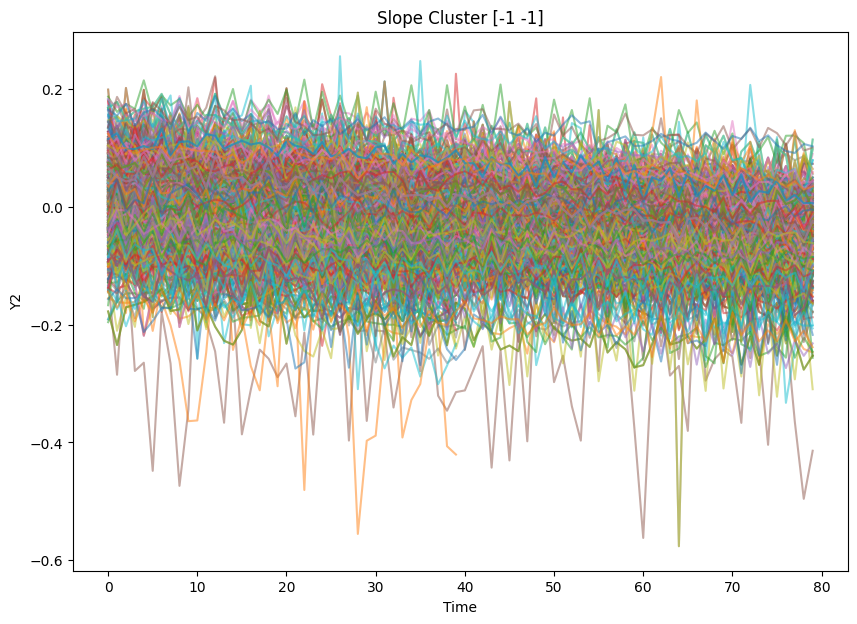

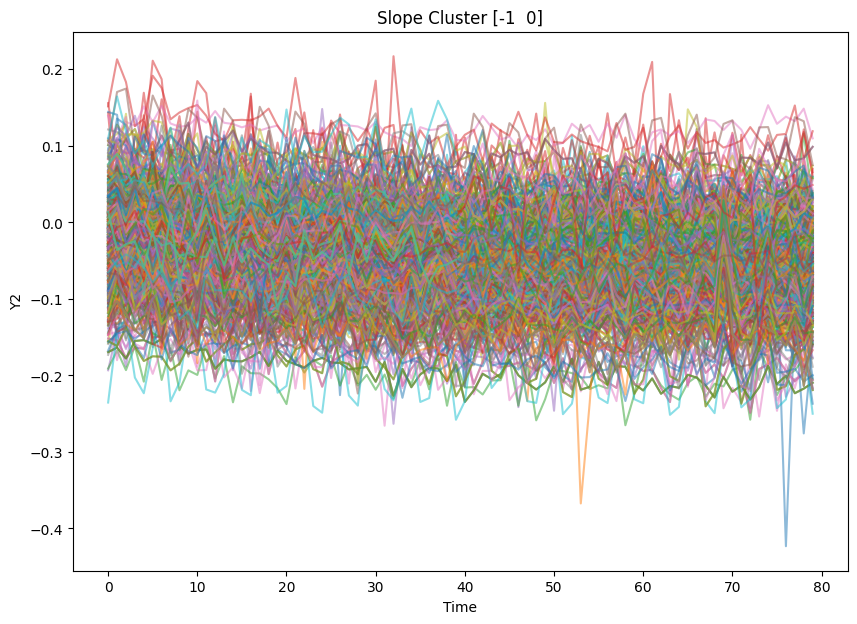

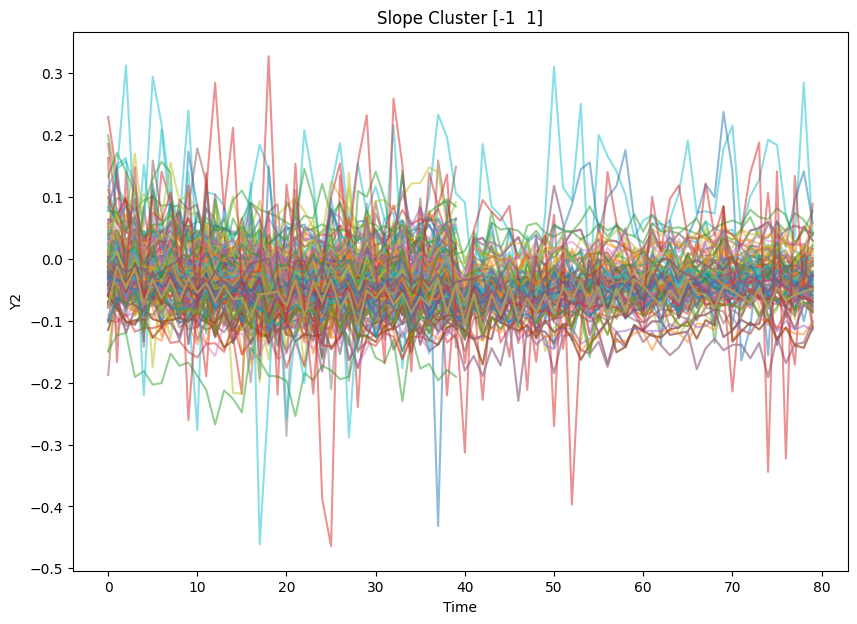

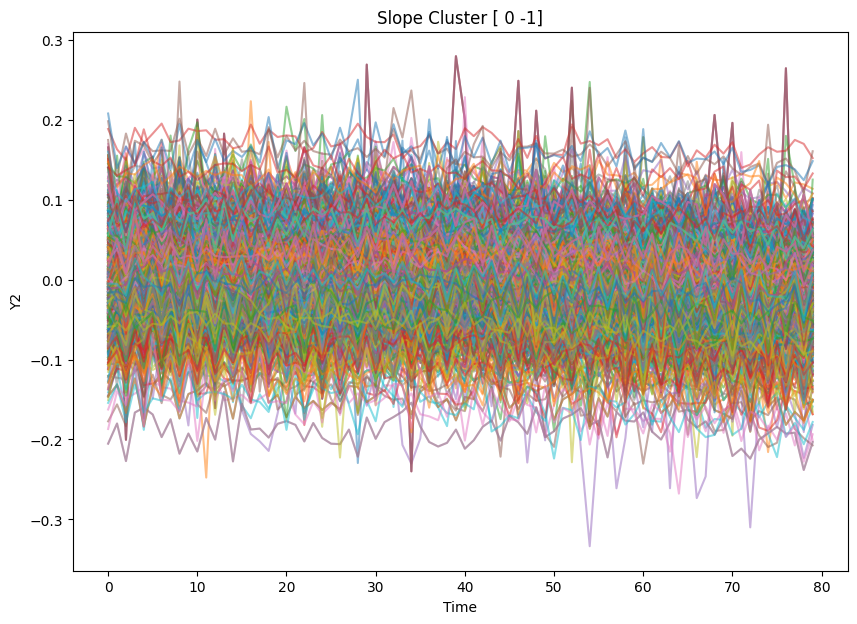

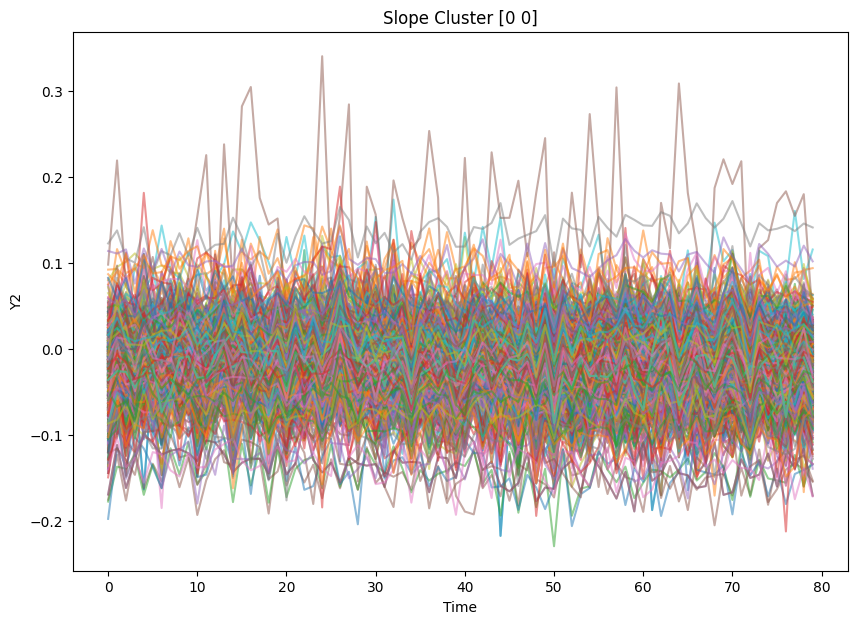

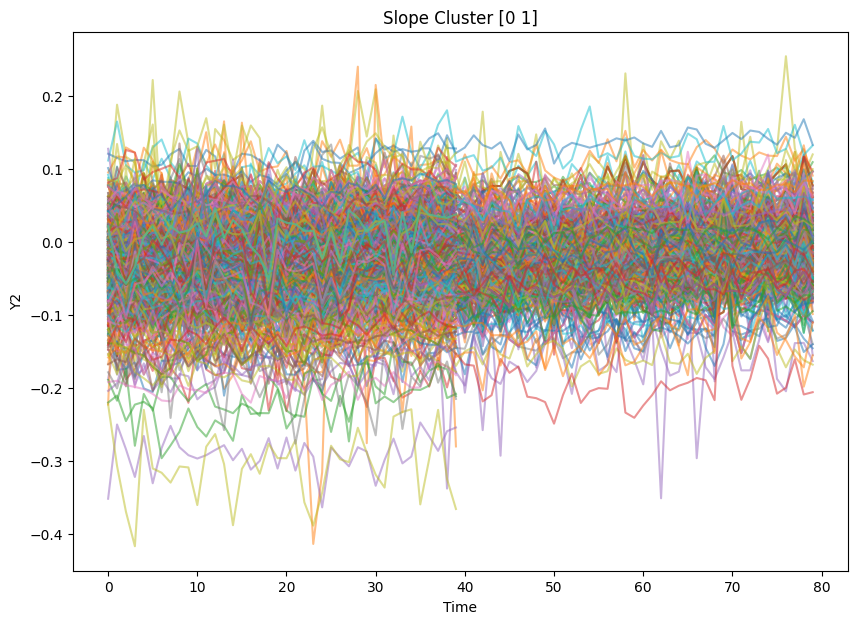

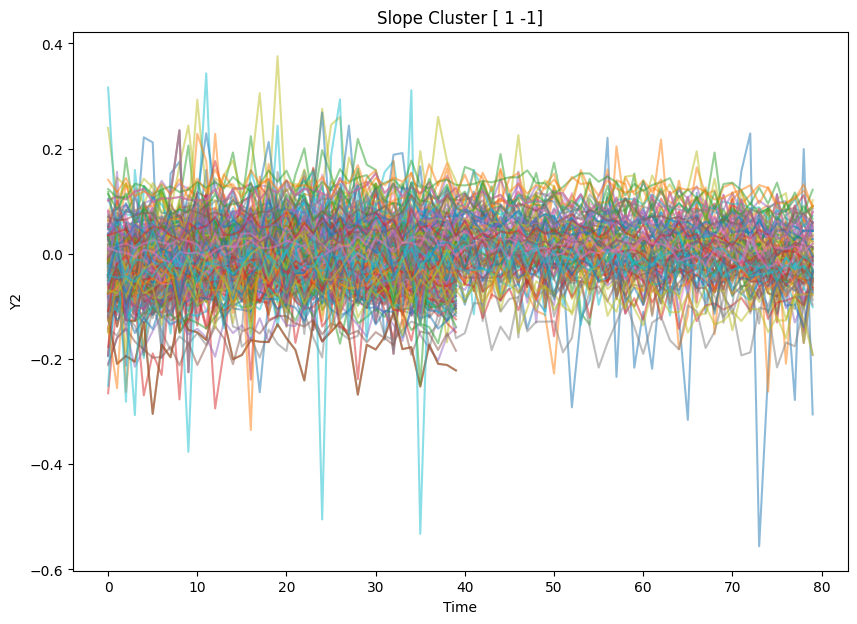

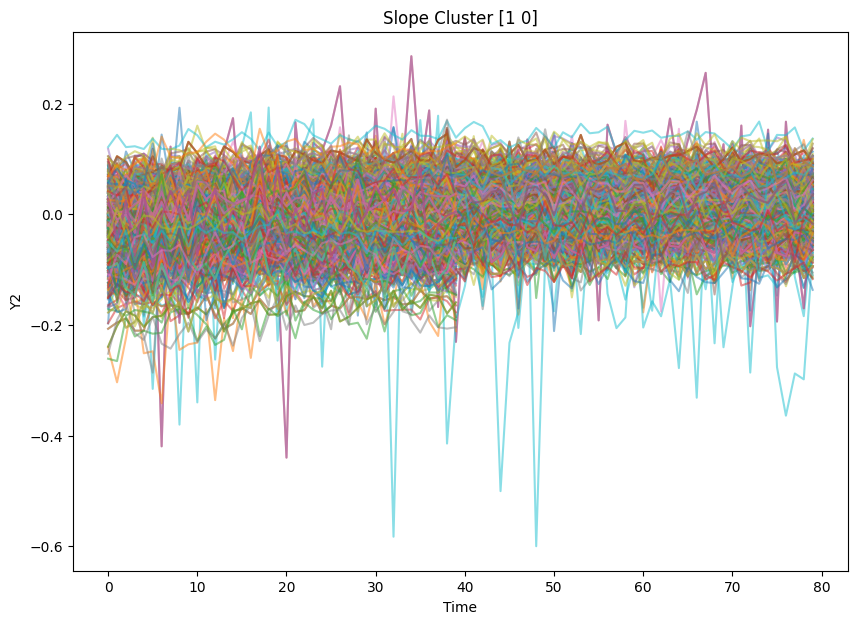

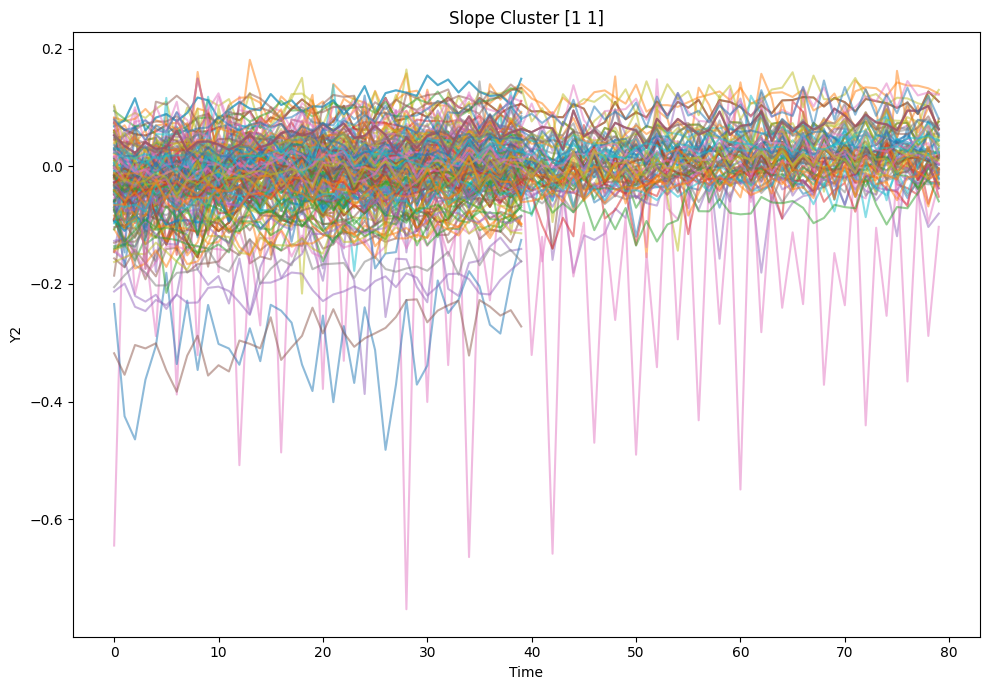

In [139]:
# plot the different clusters
data_cluster = data_cluster.reset_index(drop=True)

for cluster in np.unique(data_cluster[['slope_cluster_1_y2', 'slope_cluster_2_y2']].values, axis=0):
    data_cluster_slope = data_cluster[(data_cluster['slope_cluster_1_y2'] == cluster[0]) & (data_cluster['slope_cluster_2_y2'] == cluster[1])]
    data_y2 = data_cluster_slope.filter(like='y2_').values
    plt.figure(figsize=(10, 7))
    plt.plot(data_y2[:1000].T, alpha=0.5)
    plt.title(f'Slope Cluster {cluster}')
    plt.xlabel('Time')
    plt.ylabel('Y2')

plt.tight_layout()
plt.show()

In [ ]:
# plot the different clusters
data_cluster = data_cluster.reset_index(drop=True)

for cluster in np.unique(data_cluster[['slope_cluster_1_y2', 'slope_cluster_2_y2']].values, axis=0):
    data_cluster_slope = data_cluster[(data_cluster['slope_cluster_1_y2'] == cluster[0]) & (data_cluster['slope_cluster_2_y2'] == cluster[1])]
    data_y2 = data_cluster_slope.filter(like='y2_').values
    plt.figure(figsize=(10, 7))
    plt.plot(data_y2[:1000].T, alpha=0.5)
    plt.title(f'Slope Cluster {cluster}')
    plt.xlabel('Time')
    plt.ylabel('Y2')

plt.tight_layout()
plt.show()

In [146]:
data_cluster[data_cluster['outlier_divergent_end_down_y2'] == True][['slope_cluster_1_y2', 'slope_cluster_2_y2']]['slope_cluster_2_y2'].value_counts()

slope_cluster_2_y2
 0    2792
-1     846
 1      17
Name: count, dtype: int64

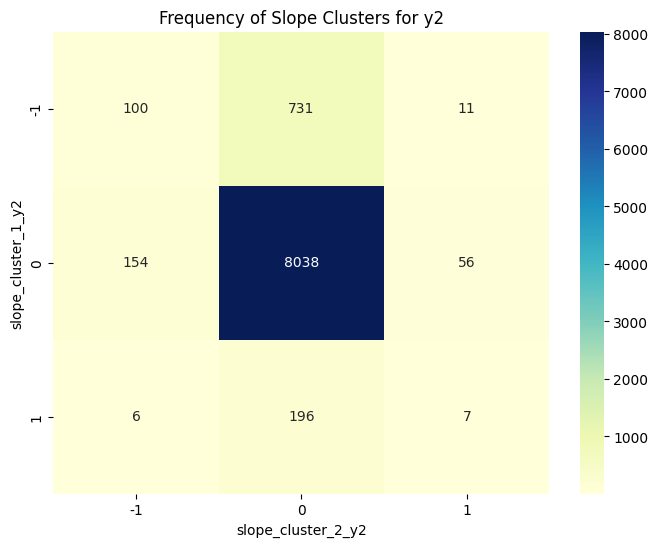

In [92]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def plot_slope_heatmap(df, col1, col2, title):
    # Create a pivot table for the frequency of each combination
    pivot_table = pd.crosstab(df[col1], df[col2])

    # Plot heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(pivot_table, annot=True, fmt="d", cmap="YlGnBu", cbar=True)
    plt.title(title)
    plt.xlabel(col2)
    plt.ylabel(col1)
    plt.show()

# Heatmap for y2 slope clusters
plot_slope_heatmap(data_cluster[data_cluster['light_regime'] == '20h_HL'], 'slope_cluster_1_y2', 'slope_cluster_2_y2', 'Frequency of Slope Clusters for y2')


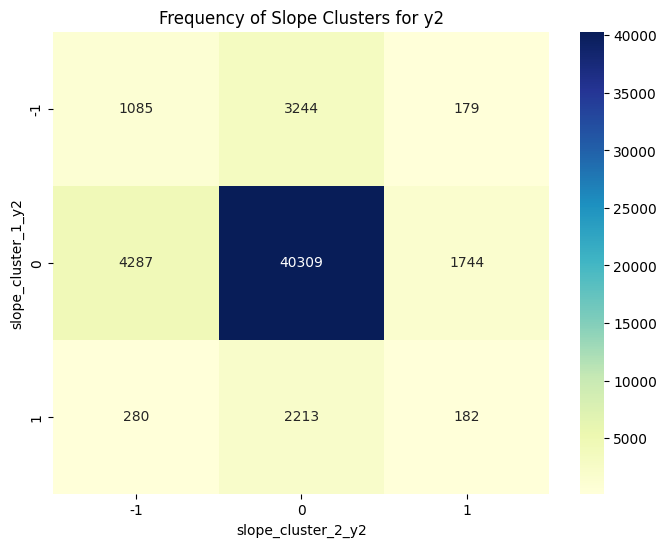

In [155]:
plot_slope_heatmap(data_cluster, 'slope_cluster_1_y2', 'slope_cluster_2_y2', 'Frequency of Slope Clusters for y2')

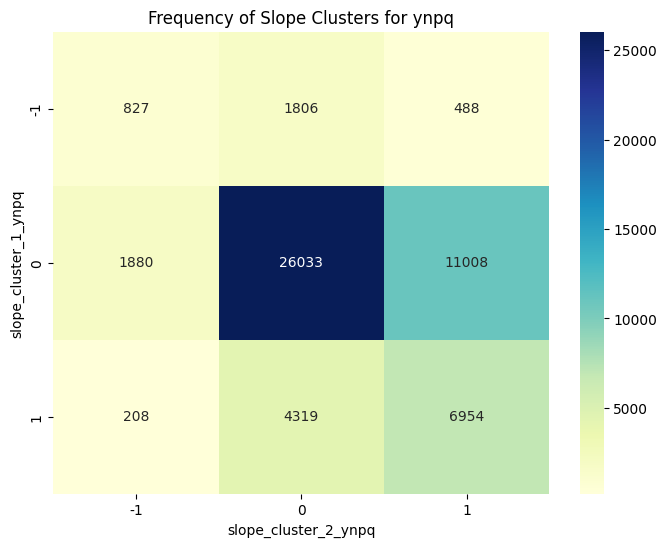

In [149]:
# Heatmap for ynpq slope clusters
plot_slope_heatmap(data_cluster, 'slope_cluster_1_ynpq', 'slope_cluster_2_ynpq', 'Frequency of Slope Clusters for ynpq')

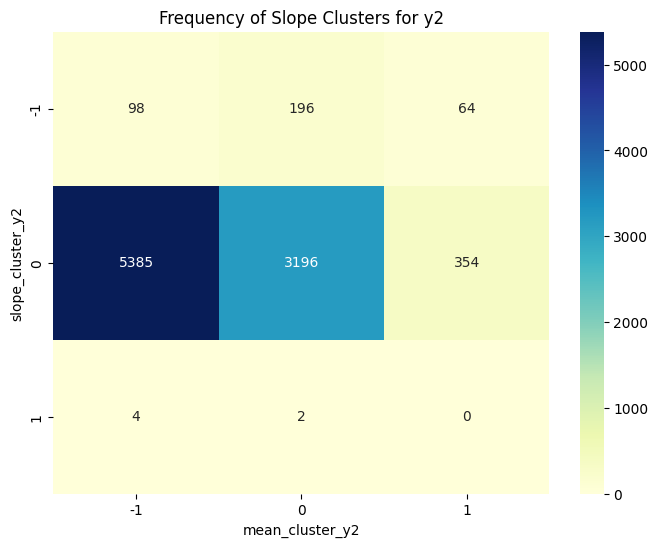

In [93]:
plot_slope_heatmap(data_cluster[data_cluster['light_regime'] == '20h_HL'], 'slope_cluster_y2', 'mean_cluster_y2', 'Frequency of Slope Clusters for y2')

In [156]:
slope_mean_vectors = data_cluster[['slope_cluster_y2', 'slope_cluster_ynpq', 'mean_cluster_y2', 'mean_cluster_ynpq']]

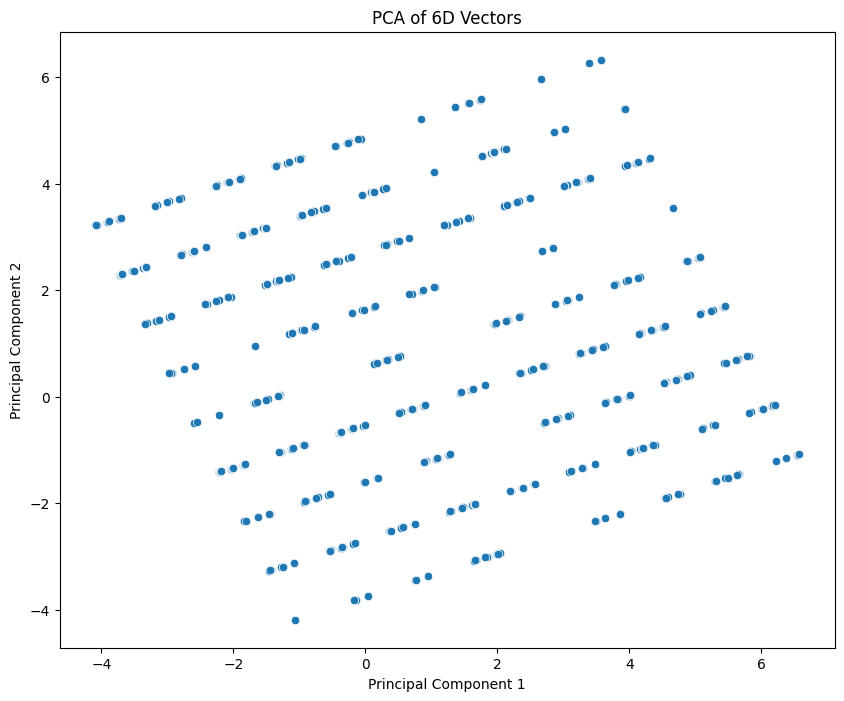

In [157]:
from sklearn.decomposition import PCA

# Perform PCA
pca = PCA(n_components=2)
reduced_data = pca.fit_transform(slope_mean_vectors.values)

# Convert to DataFrame
reduced_df = pd.DataFrame(reduced_data, columns=['PC1', 'PC2'])

# Plot the reduced data
plt.figure(figsize=(10, 8))
sns.scatterplot(x='PC1', y='PC2', data=reduced_df)
plt.title('PCA of 6D Vectors')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

/var/folders/1m/j6l58hd9755c0h_89l4yckhw0000gn/T/ipykernel_74089/3745383502.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  slope_mean_vectors['class'] = slope_mean_vectors.index


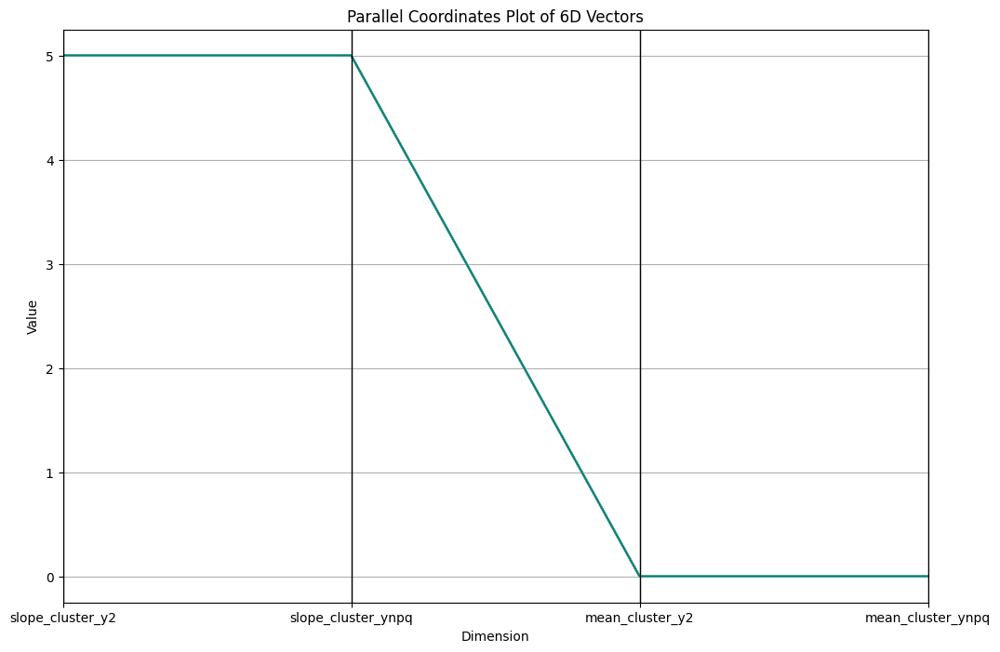

In [45]:
from pandas.plotting import parallel_coordinates

# Add a column for class/cluster if available (for coloring)
slope_mean_vectors['class'] = slope_mean_vectors.index

# Plot parallel coordinates
plt.figure(figsize=(12, 8))
parallel_coordinates(slope_mean_vectors[:10], 'class', )
plt.title('Parallel Coordinates Plot of 6D Vectors')
plt.xlabel('Dimension')
plt.ylabel('Value')
plt.legend([],[], frameon=False)
plt.show()

In [99]:
interval_y2 = np.percentile(data_slopes[(data_slopes['light_regime'] == '20h_HL') & (data_slopes['mutant_ID'] == 'WT')]['slope_y2'], [2.5, 97.5])

In [100]:
interval_y2

array([-0.00058131,  0.00062367])

Text(0.5, 1.0, 'Histogram of Slope y2 for WT in 20h_HL')

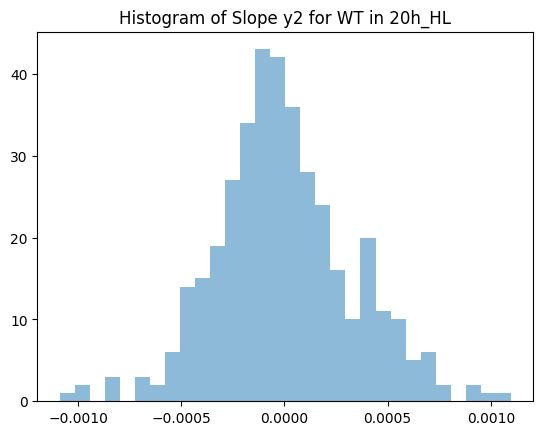

In [387]:
plt.hist(data_slopes[(data_slopes['light_regime'] == '20h_ML') & (data_slopes['mutant_ID'] == 'WT') & (data_slopes['plate'] == 99)]['slope_y2'], bins=30, alpha=0.5, label='WT')
plt.title('Histogram of Slope y2 for WT in 20h_HL')

-1.3778402608669951e-19 0.00031049551123515625


KstestResult(statistic=0.041165765888379835, pvalue=0.5198906087500017, statistic_location=8.452160710397083e-05, statistic_sign=1)

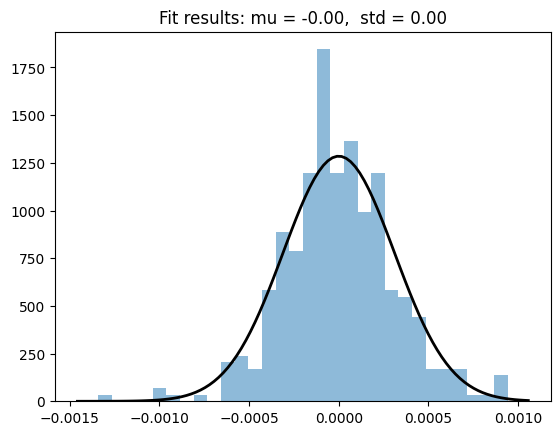

In [397]:
# fit a normal distribution to the data
from scipy.stats import norm

light = '20h_HL'

# plot the histogram
plt.hist(data_slopes[(data_slopes['light_regime'] == light) & (data_slopes['mutant_ID'] == 'WT') & (data_slopes['plate'] == 99)]['slope_y2'], bins=30, alpha=0.5, label='WT', density=True)
# get the mean and std
mu, std = norm.fit(data_slopes[(data_slopes['light_regime'] == light) & (data_slopes['mutant_ID'] == 'WT') & (data_slopes['plate'] == 99)]['slope_y2'])
print(mu, std)
# plot the pdf
xmin, xmax = plt.xlim()
x = np.linspace(xmin, xmax, 100)
p = norm.pdf(x, mu, std)
plt.plot(x, p, 'k', linewidth=2)
title = "Fit results: mu = %.2f,  std = %.2f" % (mu, std)
plt.title(title)

# do a KS test to see if the slope_y2 is normally distributed
from scipy.stats import kstest
kstest(data_slopes[(data_slopes['light_regime'] == light) & (data_slopes['mutant_ID'] == 'WT') & (data_slopes['plate'] == 99)]['slope_y2'], 'norm', args=(mu, std))

Number of mutants: 5


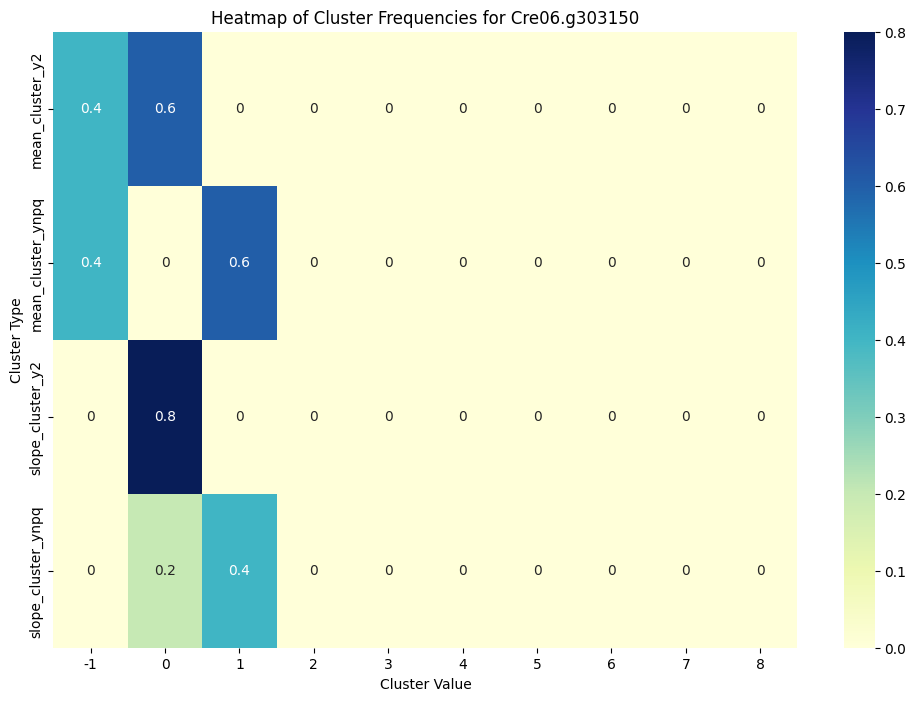

In [139]:
data_cluster_HL = data_cluster[data_cluster['light_regime'] == '20h_HL']

specific_gene = selected_genes_filtered[2]
df_gene = data_cluster_HL[data_cluster_HL['mutated_genes'] == specific_gene]

# List of cluster columns
mean_cluster_columns = ['mean_cluster_y2', 'mean_cluster_ynpq']
slope_cluster_columns = ['slope_cluster_y2', 'slope_cluster_ynpq']

# Calculate the frequency of each cluster value for the specific gene
def calculate_frequencies(df, mean_columns, slope_columns):
    freq_list = []
    for col in mean_columns:
        counts = df[col].value_counts(normalize=True).reindex([-1, 0, 1], fill_value=0)
        for val, freq in counts.items():
            freq_list.append({'cluster_type': col, 'cluster_value': val, 'frequency': freq})
    
    for col in slope_columns:
        counts = df[col].value_counts(normalize=True).reindex(range(9), fill_value=0)
        for val, freq in counts.items():
            freq_list.append({'cluster_type': col, 'cluster_value': val, 'frequency': freq})
    
    return pd.DataFrame(freq_list)

# Get frequencies
frequencies_df = calculate_frequencies(df_gene, mean_cluster_columns, slope_cluster_columns)

# Ensure all combinations are present with frequency 0 if not in the data
mean_combinations = pd.MultiIndex.from_product([mean_cluster_columns, [-1, 0, 1]], names=['cluster_type', 'cluster_value'])
slope_combinations = pd.MultiIndex.from_product([slope_cluster_columns, range(9)], names=['cluster_type', 'cluster_value'])

all_combinations = mean_combinations.union(slope_combinations)
frequencies_df = frequencies_df.set_index(['cluster_type', 'cluster_value']).reindex(all_combinations, fill_value=0).reset_index()

# Pivot the DataFrame
heatmap_data = frequencies_df.pivot_table(
    index='cluster_type', 
    columns='cluster_value', 
    values='frequency'
).fillna(0)

# Plot heatmap
plt.figure(figsize=(12, 8))
print('Number of mutants:', len(df_gene))
sns.heatmap(heatmap_data, cmap="YlGnBu", annot=True)
plt.title(f'Heatmap of Cluster Frequencies for {specific_gene}')
plt.xlabel('Cluster Value')
plt.ylabel('Cluster Type')
plt.show()

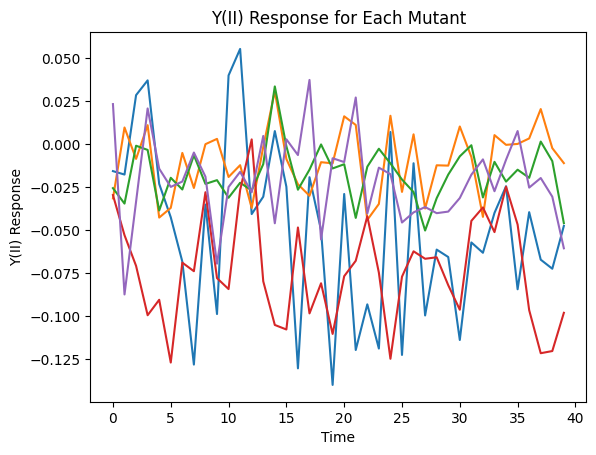

In [79]:
Data_analysis_func.plot_y2(df_gene)

In [142]:
cluster_columns = ['mean_cluster_y2', 'slope_cluster_y2']

def calculate_gene_light_frequencies(df, cluster_columns):
    freq_dict = {
        (gene, light): {col: df[(df['mutated_genes'] == gene) & (df['light_regime'] == light)][col].value_counts(normalize=True).to_dict()
                        for col in cluster_columns}
        for gene in df['mutated_genes'].unique()
        for light in df['light_regime'].unique()
    }
    return freq_dict


gene_light_frequencies = calculate_gene_light_frequencies(data_cluster, cluster_columns)

In [356]:
# Filter genes based on the condition
selected_genes = []

# for gene in data_cluster['mutated_genes'].unique():
#     meets_condition = True
#     for light in data_cluster['light_regime'].unique():
#         clusters = gene_light_frequencies.get((gene, light), {})
#         for col, freqs in clusters.items():
#             if not any(freq >= 0.6 for freq in freqs.values()):
#                 meets_condition = False
#                 break
#         if not meets_condition:
#             break
#     if meets_condition:
#         selected_genes.append(gene)

for i, gene in enumerate(data_cluster['mutated_genes'].unique()):
    meets_condition_count = 0
    meets_condition_outlier_count = 0
    total_lights = len(data_cluster['light_regime'].unique())
    for light in data_cluster['light_regime'].unique():
        clusters = gene_light_frequencies.get((gene, light), {})
        if any(freq >= 0.6 for cluster, freqs in clusters.items() if cluster != 0 for freq in freqs.values()):
            meets_condition_outlier_count += 1
        elif any(freq >= 0.6 for cluster, freqs in clusters.items() for freq in freqs.values()):
            meets_condition_count += 1

    if meets_condition_count + meets_condition_outlier_count >= total_lights * 0.8:
        selected_genes.append(gene)

In [357]:
# Filter genes based on the condition
selected_genes = []

for i, gene in enumerate(data_cluster['mutated_genes'].unique()):
    meets_condition_count = 0
    meets_condition_outlier_count = 0
    total_lights = len(data_cluster['light_regime'].unique())
    for light in data_cluster['light_regime'].unique():
        clusters = data_cluster[(data_cluster['mutated_genes'] == gene) & (data_cluster['light_regime'] == light)]['slope_cluster_y2'].value_counts(normalize=True)
        if any(freq >= 0.6 for index, freq in clusters.items() if index != 0):
            meets_condition_outlier_count += 1
        elif any(freq >= 0.6 for freq in clusters.values):
            meets_condition_count += 1

    if meets_condition_count + meets_condition_outlier_count >= total_lights * 0.8 and meets_condition_outlier_count >= 1:
        selected_genes.append(gene)

In [210]:
light = data_cluster['light_regime'].unique()[2]
print(light)
data_cluster[(data_cluster['mutated_genes'] == selected_genes[1]) & (data_cluster['light_regime'] == light)]['slope_cluster_y2'].value_counts(normalize=True)

20h_HL


slope_cluster_y2
-1    0.75
 1    0.25
Name: proportion, dtype: float64

In [246]:
data_cluster[data_cluster['mutated_genes'] == selected_genes[4]][['mutant_ID', 'mutated_genes', 'light_regime', 'slope_y2', 'slope_ynpq', 'mean_y2', 'mean_cluster_y2', 'slope_cluster_y2', 'slope_cluster_ynpq', 'mean_cluster_ynpq']]

,mutant_ID,mutated_genes,light_regime,slope_y2,slope_ynpq,mean_y2,mean_cluster_y2,slope_cluster_y2,slope_cluster_ynpq,mean_cluster_ynpq
395,LMJ.RY0402.068438,Cre01.g023450,1min-1min,-0.000140,0.000417,-0.032678,-1,0,1,0
8440,LMJ.RY0402.068438,Cre01.g023450,10min-10min,0.000011,-0.000466,-0.008812,0,0,0,0
12,LMJ.RY0402.068438,Cre01.g023450,20h_HL,-0.000160,-0.000415,-0.049274,-1,0,0,0
12,LMJ.RY0402.068438,Cre01.g023450,20h_ML,0.000717,0.000736,-0.026867,0,1,1,1
12,LMJ.RY0402.068438,Cre01.g023450,2h-2h,-0.000510,0.000663,-0.034518,-1,0,1,1
4846,LMJ.RY0402.068438,Cre01.g023450,30s-30s,0.000320,-0.000532,0.002074,0,0,0,-1


In [355]:
len(selected_genes)

863

In [214]:
# keep only the selected genes that have at least 2 mutants

selected_genes_filtered = [gene for gene in selected_genes if len(data_cluster[data_cluster['mutated_genes'] == gene]['mutant_ID'].unique()) >= 2]

In [215]:
len(selected_genes_filtered)

410

In [58]:
len([gene for gene in data_cluster['mutated_genes'].unique() if len(data_cluster[data_cluster['mutated_genes'] == gene]['mutant_ID'].unique()) >= 2])

2604

In [59]:
len(data_cluster['mutated_genes'].unique())

3490

In [150]:
data_cluster[data_cluster['mutated_genes'] == selected_genes_filtered[3]]

,plate,measurement,start_date,light_regime,dark_threshold,light_threshold,num_frames,i,j,fv_fm,...,slope_1_ynpq,slope_2_ynpq,slope_cluster_1_y2,slope_cluster_2_y2,slope_cluster_1_ynpq,slope_cluster_2_ynpq,mean_cluster_y2,mean_cluster_ynpq,slope_cluster_y2,slope_cluster_ynpq
987,3,M1,2023-10-24,1min-1min,18.438145,26.253667,164,7,17,-0.003187,...,0.000445,0.000750,0,0,0,0,0,1,5,5
3048,9,M1,2023-12-09,1min-1min,18.247269,26.029377,164,12,20,0.031440,...,0.000922,0.000599,0,0,0,0,0,1,5,5
3435,10,M1,2023-12-15,1min-1min,18.585787,27.033847,164,11,17,-0.053108,...,0.000541,0.000421,0,0,0,0,-1,0,5,5
11926,9,M6,2023-12-14,10min-10min,18.344681,26.977798,164,12,20,0.033173,...,0.000640,0.000901,0,0,0,0,0,1,5,5
12313,10,M5,2023-12-19,10min-10min,18.638811,26.561027,164,11,17,-0.032947,...,0.000224,0.000282,0,0,0,0,-1,0,5,5
18706,3,M5,2024-04-14,10min-10min,14.449725,26.741834,164,7,17,-0.007165,...,0.000116,0.000123,0,0,0,0,0,0,5,5
19917,3,M2,2023-10-25,20h_HL,22.022222,27.669680,84,7,17,-0.002815,...,0.001778,0.004304,0,0,1,1,-1,1,5,8
22397,9,M2,2023-12-10,20h_HL,19.137134,25.368294,84,12,20,0.039036,...,0.001989,0.002658,0,-1,1,1,0,1,2,8
22783,10,M2,2023-12-16,20h_HL,19.466059,25.125945,84,11,17,-0.020954,...,0.000310,0.001829,0,-1,0,1,-1,0,2,7
29216,3,M3,2023-10-26,20h_ML,20.182906,27.214206,84,7,17,-0.005245,...,0.001001,0.001448,0,0,1,1,0,0,5,8


In [228]:
data_cluster[data_cluster['mutated_genes'].isin(selected_genes_filtered)].sort_values(by='slope_y2')['mutated_genes'].unique()[4]

'Cre01.g021550'

In [235]:
data_cluster[data_cluster['mutated_genes'].isin(selected_genes_filtered)].sort_values(by='slope_y2')['mutated_genes'].unique()[8]

'Cre17.g716050'

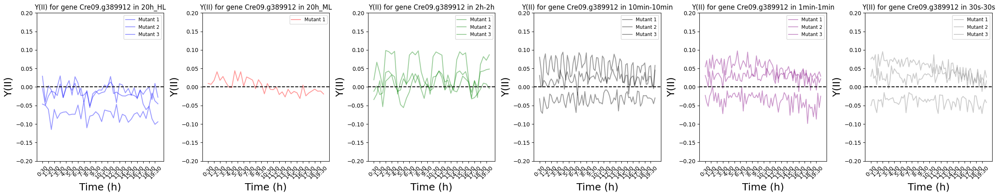

In [435]:
list_genes = [5]

# Define the gene of interest and light regimes
# gene_of_interest = selected_genes_filtered[5]
gene_of_interest = data_cluster[data_cluster['mutated_genes'].isin(selected_genes_filtered)].sort_values(by='slope_y2')['mutated_genes'].unique()[4]
# gene_of_interest = data_cluster['mutated_genes'].unique()[200]
# gene_of_interest = final_mutants['mutated_genes'].unique()[180]
# gene_of_interest = data_norm_flagged.sort_values(by='mean_reduced_v2_y2', ascending=False)['mutated_genes'].unique()[350]
gene_of_interest = 'Cre09.g389912'
# Define the desired order
desired_order = ['20h_HL', '20h_ML', '2h-2h', '10min-10min', '1min-1min', '30s-30s']

# Create a dictionary to map each value to its position in the desired order
order_map = {value: index for index, value in enumerate(desired_order)}

# Define a sorting key function using the order_map
def custom_sort_key(value):
    return order_map.get(value, len(desired_order))  # Use a default value that places unknown items at the end

# Sample array containing some of the values
light_regimes = data_cluster[(data_cluster['mutated_genes'] == gene_of_interest)]['light_regime'].unique()

# Sort the array using the custom sort key
sorted_light_regimes = sorted(light_regimes, key=custom_sort_key)
titles = ['Y(II) for gene ' + str(gene_of_interest) + ' in ' + light for light in sorted_light_regimes]
colors = ['b', 'r', 'g', 'k', 'purple', 'grey']
colors = colors[:len(titles)]
def generate_custom_labels(num_ticks, step=60):
    labels = []
    for i in range(num_ticks):
        minutes = i * step + 30
        hours = minutes // 60
        minutes = minutes % 60
        labels.append(f"{hours}:{minutes:02d}")
        # else:
        #     labels.append(f"{minutes}min")
    return labels

# Prepare subplot layout
fig, axes = plt.subplots(1, len(titles), figsize=(25, 5))

# Iterate over light regimes and plot Y(II) values
for i, (light_regime, color, title) in enumerate(zip(sorted_light_regimes, colors, titles)):
    # Filter data for the current gene and light regime
    filtered_data = data_cluster[(data_cluster['mutated_genes'] == gene_of_interest) & 
                                           (data_cluster['light_regime'] == light_regime)]
    
    # print('light_regime :' , light_regime, 'fv_fm : ', filtered_data['fv_fm'].values)
    
    # Extract Y(II) values and plot each line
    y2_values = filtered_data.filter(regex=r'^y2_\d+$').dropna(axis=1).values
    for j in range(y2_values.shape[0]):
        # if y2_values[j].std() < 0.0375:
        axes[i].plot(y2_values[j], c=color, alpha=0.4, label='Mutant {}'.format(j+1))
    
    axes[i].axhline(y=0, color='black', linestyle='--')
    # Set title and other plot properties
    axes[i].set_title(title)
    axes[i].set_xlabel('Time (h)', fontsize=18)
    axes[i].set_ylabel('Y(II)', fontsize=18)
    axes[i].set_ylim(-0.2, 0.2)
    axes[i].legend(loc='upper right', fontsize='small')
    if light_regime in ['1min-1min', '30s-30s', '10min-10min']:
        custom_labels = generate_custom_labels(20)
        axes[i].set_xticks(range(0, 80, 4))
    else :
        axes[i].set_xticks(range(0, 40, 2))
        custom_labels = generate_custom_labels(20)
    axes[i].set_xticklabels(custom_labels, rotation=45)


# Adjust layout and display the plot
plt.tight_layout()
plt.show()

In [414]:
data_cluster[data_cluster['mutated_genes'] == 'Cre17.g716050']['mutant_ID'].unique()

array(['LMJ.RY0402.256210', 'LMJ.RY0402.151334', 'LMJ.RY0402.174457'],
      dtype=object)

In [417]:
data_cluster[data_cluster['mutated_genes'] == 'Cre01.g021550']['mutant_ID'].unique()

array(['LMJ.RY0402.178240', 'LMJ.RY0402.154491'], dtype=object)

In [411]:
data_cluster[data_cluster['mutated_genes'] == gene_of_interest][['mutant_ID', 'mutated_genes', 'feature', 'flag_y2', 'light_regime', 'slope_y2', 'slope_ynpq', 'mean_y2', 'mean_cluster_y2', 'slope_cluster_y2', 'slope_cluster_ynpq', 'mean_cluster_ynpq']]

,mutant_ID,mutated_genes,feature,flag_y2,light_regime,slope_y2,slope_ynpq,mean_y2,mean_cluster_y2,slope_cluster_y2,slope_cluster_ynpq,mean_cluster_ynpq
1349,LMJ.RY0402.103909,Cre06.g285451,CDS,weird,1min-1min,0.000083,-0.000212,0.100518,1,0,0,0
1929,LMJ.RY0402.125941,Cre06.g285451,intron,weird,1min-1min,-0.000461,-0.000003,0.068496,1,0,0,0
548,LMJ.RY0402.103909,Cre06.g285451,CDS,ok,10min-10min,-0.000191,-0.000158,0.070582,1,0,0,0
1129,LMJ.RY0402.125941,Cre06.g285451,intron,ok,10min-10min,-0.000548,-0.000485,0.067958,1,0,0,-1
967,LMJ.RY0402.103909,Cre06.g285451,CDS,ok,20h_HL,-0.002500,0.001017,0.068828,1,-1,1,0
1548,LMJ.RY0402.125941,Cre06.g285451,intron,ok,20h_HL,-0.003800,-0.000615,0.044036,1,-1,-1,-1
971,LMJ.RY0402.103909,Cre06.g285451,CDS,ok,20h_ML,-0.001424,0.002557,0.081027,1,-1,1,1
1552,LMJ.RY0402.125941,Cre06.g285451,intron,ok,20h_ML,-0.001604,-0.000227,0.042827,1,-1,0,0
965,LMJ.RY0402.103909,Cre06.g285451,CDS,ok,2h-2h,-0.000376,0.001043,0.062537,1,0,1,0
1547,LMJ.RY0402.125941,Cre06.g285451,intron,ok,2h-2h,-0.000869,-0.000437,0.079377,1,-1,0,-1


In [436]:
data_cluster[data_cluster['mutated_genes'] == gene_of_interest]

,plate,measurement,start_date,light_regime,dark_threshold,light_threshold,num_frames,i,j,fv_fm,mask_area,y2_1,y2_2,y2_3,y2_4,y2_5,y2_6,y2_7,y2_8,y2_9,y2_10,y2_11,y2_12,y2_13,y2_14,y2_15,y2_16,y2_17,y2_18,y2_19,y2_20,y2_21,y2_22,y2_23,y2_24,y2_25,y2_26,y2_27,y2_28,y2_29,y2_30,y2_31,y2_32,y2_33,y2_34,y2_35,y2_36,y2_37,y2_38,y2_39,y2_40,y2_41,y2_42,y2_43,y2_44,y2_45,y2_46,y2_47,y2_48,y2_49,y2_50,y2_51,y2_52,y2_53,y2_54,y2_55,y2_56,y2_57,y2_58,y2_59,y2_60,y2_61,y2_62,y2_63,y2_64,y2_65,y2_66,y2_67,y2_68,y2_69,y2_70,y2_71,y2_72,y2_73,y2_74,y2_75,y2_76,y2_77,y2_78,y2_79,y2_80,ynpq_1,ynpq_2,ynpq_3,ynpq_4,ynpq_5,ynpq_6,ynpq_7,ynpq_8,ynpq_9,ynpq_10,ynpq_11,ynpq_12,ynpq_13,ynpq_14,ynpq_15,ynpq_16,ynpq_17,ynpq_18,ynpq_19,ynpq_20,ynpq_21,ynpq_22,ynpq_23,ynpq_24,ynpq_25,ynpq_26,ynpq_27,ynpq_28,ynpq_29,ynpq_30,ynpq_31,ynpq_32,ynpq_33,ynpq_34,ynpq_35,ynpq_36,ynpq_37,ynpq_38,ynpq_39,ynpq_40,ynpq_41,ynpq_42,ynpq_43,ynpq_44,ynpq_45,ynpq_46,ynpq_47,ynpq_48,ynpq_49,ynpq_50,ynpq_51,ynpq_52,ynpq_53,ynpq_54,ynpq_55,ynpq_56,ynpq_57,ynpq_58,ynpq_59,ynpq_60,ynpq_61,ynpq_62,ynpq_63,ynpq_64,ynpq_65,ynpq_66,ynpq_67,ynpq_68,ynpq_69,ynpq_70,ynpq_71,ynpq_72,ynpq_73,ynpq_74,ynpq_75,ynpq_76,ynpq_77,ynpq_78,ynpq_79,ynpq_80,measurement_time_0,measurement_time_1,measurement_time_2,measurement_time_3,measurement_time_4,measurement_time_5,measurement_time_6,measurement_time_7,measurement_time_8,measurement_time_9,measurement_time_10,measurement_time_11,measurement_time_12,measurement_time_13,measurement_time_14,measurement_time_15,measurement_time_16,measurement_time_17,measurement_time_18,measurement_time_19,measurement_time_20,measurement_time_21,measurement_time_22,measurement_time_23,measurement_time_24,measurement_time_25,measurement_time_26,measurement_time_27,measurement_time_28,measurement_time_29,measurement_time_30,measurement_time_31,measurement_time_32,measurement_time_33,measurement_time_34,measurement_time_35,measurement_time_36,measurement_time_37,measurement_time_38,measurement_time_39,measurement_time_40,measurement_time_41,measurement_time_42,measurement_time_43,measurement_time_44,measurement_time_45,measurement_time_46,measurement_time_47,measurement_time_48,measurement_time_49,measurement_time_50,measurement_time_51,measurement_time_52,measurement_time_53,measurement_time_54,measurement_time_55,measurement_time_56,measurement_time_57,measurement_time_58,measurement_time_59,measurement_time_60,measurement_time_61,measurement_time_62,measurement_time_63,measurement_time_64,measurement_time_65,measurement_time_66,measurement_time_67,measurement_time_68,measurement_time_69,measurement_time_70,measurement_time_71,measurement_time_72,measurement_time_73,measurement_time_74,measurement_time_75,measurement_time_76,measurement_time_77,measurement_time_78,measurement_time_79,measurement_time_80,measurement_time_81,F_0,Fm_0,F_1,Fm_1,F_2,Fm_2,F_3,Fm_3,F_4,Fm_4,F_5,Fm_5,F_6,Fm_6,F_7,Fm_7,F_8,Fm_8,F_9,Fm_9,F_10,Fm_10,F_11,Fm_11,F_12,Fm_12,F_13,Fm_13,F_14,Fm_14,F_15,Fm_15,F_16,Fm_16,F_17,Fm_17,F_18,Fm_18,F_19,Fm_19,F_20,Fm_20,F_21,Fm_21,F_22,Fm_22,F_23,Fm_23,F_24,Fm_24,F_25,Fm_25,F_26,Fm_26,F_27,Fm_27,F_28,Fm_28,F_29,Fm_29,F_30,Fm_30,F_31,Fm_31,F_32,Fm_32,F_33,Fm_33,F_34,Fm_34,F_35,Fm_35,F_36,Fm_36,F_37,Fm_37,F_38,Fm_38,F_39,Fm_39,F_40,Fm_40,F_41,Fm_41,F_42,Fm_42,F_43,Fm_43,F_44,Fm_44,F_45,Fm_45,F_46,Fm_46,F_47,Fm_47,F_48,Fm_48,F_49,Fm_49,F_50,Fm_50,F_51,Fm_51,F_52,Fm_52,F_53,Fm_53,F_54,Fm_54,F_55,Fm_55,F_56,Fm_56,F_57,Fm_57,F_58,Fm_58,F_59,Fm_59,F_60,Fm_60,F_61,Fm_61,F_62,Fm_62,F_63,Fm_63,F_64,Fm_64,F_65,Fm_65,F_66,Fm_66,F_67,Fm_67,F_68,Fm_68,F_69,Fm_69,F_70,Fm_70,F_71,Fm_71,F_72,Fm_72,F_73,Fm_73,F_74,Fm_74,F_75,Fm_75,F_76,Fm_76,F_77,Fm_77,F_78,Fm_78,F_79,Fm_79,F_80,Fm_80,F_81,Fm_81,well_id,mutant_ID,feature,mutated_genes,num_mutations,fv_fm_end,ynpqend,well_id_numeric,mean_y2,mean_ynpq,median,log_likelihood_null,mutated_genes_light_regime_count,fv_fm_WT,fv_fm_end_WT,ynpqend_WT,flag_y2,flag_ynpq,slope_1_y2,slope_2_y2,slope_y2,slope_1_ynpq,slope_2_ynpq,slope_y

In [352]:
data_cluster[data_cluster['mutated_genes'].isin(selected_genes_filtered)].sort_values(by='slope_y2')

,plate,measurement,start_date,light_regime,dark_threshold,light_threshold,num_frames,i,j,fv_fm,mask_area,y2_1,y2_2,y2_3,y2_4,y2_5,y2_6,y2_7,y2_8,y2_9,y2_10,y2_11,y2_12,y2_13,y2_14,y2_15,y2_16,y2_17,y2_18,y2_19,y2_20,y2_21,y2_22,y2_23,y2_24,y2_25,y2_26,y2_27,y2_28,y2_29,y2_30,y2_31,y2_32,y2_33,y2_34,y2_35,y2_36,y2_37,y2_38,y2_39,y2_40,y2_41,y2_42,y2_43,y2_44,y2_45,y2_46,y2_47,y2_48,y2_49,y2_50,y2_51,y2_52,y2_53,y2_54,y2_55,y2_56,y2_57,y2_58,y2_59,y2_60,y2_61,y2_62,y2_63,y2_64,y2_65,y2_66,y2_67,y2_68,y2_69,y2_70,y2_71,y2_72,y2_73,y2_74,y2_75,y2_76,y2_77,y2_78,y2_79,y2_80,ynpq_1,ynpq_2,ynpq_3,ynpq_4,ynpq_5,ynpq_6,ynpq_7,ynpq_8,ynpq_9,ynpq_10,ynpq_11,ynpq_12,ynpq_13,ynpq_14,ynpq_15,ynpq_16,ynpq_17,ynpq_18,ynpq_19,ynpq_20,ynpq_21,ynpq_22,ynpq_23,ynpq_24,ynpq_25,ynpq_26,ynpq_27,ynpq_28,ynpq_29,ynpq_30,ynpq_31,ynpq_32,ynpq_33,ynpq_34,ynpq_35,ynpq_36,ynpq_37,ynpq_38,ynpq_39,ynpq_40,ynpq_41,ynpq_42,ynpq_43,ynpq_44,ynpq_45,ynpq_46,ynpq_47,ynpq_48,ynpq_49,ynpq_50,ynpq_51,ynpq_52,ynpq_53,ynpq_54,ynpq_55,ynpq_56,ynpq_57,ynpq_58,ynpq_59,ynpq_60,ynpq_61,ynpq_62,ynpq_63,ynpq_64,ynpq_65,ynpq_66,ynpq_67,ynpq_68,ynpq_69,ynpq_70,ynpq_71,ynpq_72,ynpq_73,ynpq_74,ynpq_75,ynpq_76,ynpq_77,ynpq_78,ynpq_79,ynpq_80,measurement_time_0,measurement_time_1,measurement_time_2,measurement_time_3,measurement_time_4,measurement_time_5,measurement_time_6,measurement_time_7,measurement_time_8,measurement_time_9,measurement_time_10,measurement_time_11,measurement_time_12,measurement_time_13,measurement_time_14,measurement_time_15,measurement_time_16,measurement_time_17,measurement_time_18,measurement_time_19,measurement_time_20,measurement_time_21,measurement_time_22,measurement_time_23,measurement_time_24,measurement_time_25,measurement_time_26,measurement_time_27,measurement_time_28,measurement_time_29,measurement_time_30,measurement_time_31,measurement_time_32,measurement_time_33,measurement_time_34,measurement_time_35,measurement_time_36,measurement_time_37,measurement_time_38,measurement_time_39,measurement_time_40,measurement_time_41,measurement_time_42,measurement_time_43,measurement_time_44,measurement_time_45,measurement_time_46,measurement_time_47,measurement_time_48,measurement_time_49,measurement_time_50,measurement_time_51,measurement_time_52,measurement_time_53,measurement_time_54,measurement_time_55,measurement_time_56,measurement_time_57,measurement_time_58,measurement_time_59,measurement_time_60,measurement_time_61,measurement_time_62,measurement_time_63,measurement_time_64,measurement_time_65,measurement_time_66,measurement_time_67,measurement_time_68,measurement_time_69,measurement_time_70,measurement_time_71,measurement_time_72,measurement_time_73,measurement_time_74,measurement_time_75,measurement_time_76,measurement_time_77,measurement_time_78,measurement_time_79,measurement_time_80,measurement_time_81,F_0,Fm_0,F_1,Fm_1,F_2,Fm_2,F_3,Fm_3,F_4,Fm_4,F_5,Fm_5,F_6,Fm_6,F_7,Fm_7,F_8,Fm_8,F_9,Fm_9,F_10,Fm_10,F_11,Fm_11,F_12,Fm_12,F_13,Fm_13,F_14,Fm_14,F_15,Fm_15,F_16,Fm_16,F_17,Fm_17,F_18,Fm_18,F_19,Fm_19,F_20,Fm_20,F_21,Fm_21,F_22,Fm_22,F_23,Fm_23,F_24,Fm_24,F_25,Fm_25,F_26,Fm_26,F_27,Fm_27,F_28,Fm_28,F_29,Fm_29,F_30,Fm_30,F_31,Fm_31,F_32,Fm_32,F_33,Fm_33,F_34,Fm_34,F_35,Fm_35,F_36,Fm_36,F_37,Fm_37,F_38,Fm_38,F_39,Fm_39,F_40,Fm_40,F_41,Fm_41,F_42,Fm_42,F_43,Fm_43,F_44,Fm_44,F_45,Fm_45,F_46,Fm_46,F_47,Fm_47,F_48,Fm_48,F_49,Fm_49,F_50,Fm_50,F_51,Fm_51,F_52,Fm_52,F_53,Fm_53,F_54,Fm_54,F_55,Fm_55,F_56,Fm_56,F_57,Fm_57,F_58,Fm_58,F_59,Fm_59,F_60,Fm_60,F_61,Fm_61,F_62,Fm_62,F_63,Fm_63,F_64,Fm_64,F_65,Fm_65,F_66,Fm_66,F_67,Fm_67,F_68,Fm_68,F_69,Fm_69,F_70,Fm_70,F_71,Fm_71,F_72,Fm_72,F_73,Fm_73,F_74,Fm_74,F_75,Fm_75,F_76,Fm_76,F_77,Fm_77,F_78,Fm_78,F_79,Fm_79,F_80,Fm_80,F_81,Fm_81,well_id,mutant_ID,feature,mutated_genes,num_mutations,fv_fm_end,ynpqend,well_id_numeric,mean_y2,mean_ynpq,median,log_likelihood_null,mutated_genes_light_regime_count,fv_fm_WT,fv_fm_end_WT,ynpqend_WT,flag_y2,flag_ynpq,slope_1_y2,slope_2_y2,slope_y2,slope_1_ynpq,slope_2_ynpq,slope_y

In [353]:
slope_outliers = data_cluster[data_cluster['mutated_genes'].isin(selected_genes_filtered)]

In [354]:
len(slope_outliers)

6841

In [253]:
final_mutants = pd.read_csv('final_mutants_all_mutants_05_14_2024.csv')

In [257]:
final_mutants

,Unnamed: 0,plate,measurement,start_date,light_regime,dark_threshold,light_threshold,num_frames,i,j,fv_fm,mask_area,y2_1,y2_2,y2_3,y2_4,y2_5,y2_6,y2_7,y2_8,y2_9,y2_10,y2_11,y2_12,y2_13,y2_14,y2_15,y2_16,y2_17,y2_18,y2_19,y2_20,y2_21,y2_22,y2_23,y2_24,y2_25,y2_26,y2_27,y2_28,y2_29,y2_30,y2_31,y2_32,y2_33,y2_34,y2_35,y2_36,y2_37,y2_38,y2_39,y2_40,y2_41,y2_42,y2_43,y2_44,y2_45,y2_46,y2_47,y2_48,y2_49,y2_50,y2_51,y2_52,y2_53,y2_54,y2_55,y2_56,y2_57,y2_58,y2_59,y2_60,y2_61,y2_62,y2_63,y2_64,y2_65,y2_66,y2_67,y2_68,y2_69,y2_70,y2_71,y2_72,y2_73,y2_74,y2_75,y2_76,y2_77,y2_78,y2_79,y2_80,ynpq_1,ynpq_2,ynpq_3,ynpq_4,ynpq_5,ynpq_6,ynpq_7,ynpq_8,ynpq_9,ynpq_10,ynpq_11,ynpq_12,ynpq_13,ynpq_14,ynpq_15,ynpq_16,ynpq_17,ynpq_18,ynpq_19,ynpq_20,ynpq_21,ynpq_22,ynpq_23,ynpq_24,ynpq_25,ynpq_26,ynpq_27,ynpq_28,ynpq_29,ynpq_30,ynpq_31,ynpq_32,ynpq_33,ynpq_34,ynpq_35,ynpq_36,ynpq_37,ynpq_38,ynpq_39,ynpq_40,ynpq_41,ynpq_42,ynpq_43,ynpq_44,ynpq_45,ynpq_46,ynpq_47,ynpq_48,ynpq_49,ynpq_50,ynpq_51,ynpq_52,ynpq_53,ynpq_54,ynpq_55,ynpq_56,ynpq_57,ynpq_58,ynpq_59,ynpq_60,ynpq_61,ynpq_62,ynpq_63,ynpq_64,ynpq_65,ynpq_66,ynpq_67,ynpq_68,ynpq_69,ynpq_70,ynpq_71,ynpq_72,ynpq_73,ynpq_74,ynpq_75,ynpq_76,ynpq_77,ynpq_78,ynpq_79,ynpq_80,measurement_time_0,measurement_time_1,measurement_time_2,measurement_time_3,measurement_time_4,measurement_time_5,measurement_time_6,measurement_time_7,measurement_time_8,measurement_time_9,measurement_time_10,measurement_time_11,measurement_time_12,measurement_time_13,measurement_time_14,measurement_time_15,measurement_time_16,measurement_time_17,measurement_time_18,measurement_time_19,measurement_time_20,measurement_time_21,measurement_time_22,measurement_time_23,measurement_time_24,measurement_time_25,measurement_time_26,measurement_time_27,measurement_time_28,measurement_time_29,measurement_time_30,measurement_time_31,measurement_time_32,measurement_time_33,measurement_time_34,measurement_time_35,measurement_time_36,measurement_time_37,measurement_time_38,measurement_time_39,measurement_time_40,measurement_time_41,measurement_time_42,measurement_time_43,measurement_time_44,measurement_time_45,measurement_time_46,measurement_time_47,measurement_time_48,measurement_time_49,measurement_time_50,measurement_time_51,measurement_time_52,measurement_time_53,measurement_time_54,measurement_time_55,measurement_time_56,measurement_time_57,measurement_time_58,measurement_time_59,measurement_time_60,measurement_time_61,measurement_time_62,measurement_time_63,measurement_time_64,measurement_time_65,measurement_time_66,measurement_time_67,measurement_time_68,measurement_time_69,measurement_time_70,measurement_time_71,measurement_time_72,measurement_time_73,measurement_time_74,measurement_time_75,measurement_time_76,measurement_time_77,measurement_time_78,measurement_time_79,measurement_time_80,measurement_time_81,F_0,Fm_0,F_1,Fm_1,F_2,Fm_2,F_3,Fm_3,F_4,Fm_4,F_5,Fm_5,F_6,Fm_6,F_7,Fm_7,F_8,Fm_8,F_9,Fm_9,F_10,Fm_10,F_11,Fm_11,F_12,Fm_12,F_13,Fm_13,F_14,Fm_14,F_15,Fm_15,F_16,Fm_16,F_17,Fm_17,F_18,Fm_18,F_19,Fm_19,F_20,Fm_20,F_21,Fm_21,F_22,Fm_22,F_23,Fm_23,F_24,Fm_24,F_25,Fm_25,F_26,Fm_26,F_27,Fm_27,F_28,Fm_28,F_29,Fm_29,F_30,Fm_30,F_31,Fm_31,F_32,Fm_32,F_33,Fm_33,F_34,Fm_34,F_35,Fm_35,F_36,Fm_36,F_37,Fm_37,F_38,Fm_38,F_39,Fm_39,F_40,Fm_40,F_41,Fm_41,F_42,Fm_42,F_43,Fm_43,F_44,Fm_44,F_45,Fm_45,F_46,Fm_46,F_47,Fm_47,F_48,Fm_48,F_49,Fm_49,F_50,Fm_50,F_51,Fm_51,F_52,Fm_52,F_53,Fm_53,F_54,Fm_54,F_55,Fm_55,F_56,Fm_56,F_57,Fm_57,F_58,Fm_58,F_59,Fm_59,F_60,Fm_60,F_61,Fm_61,F_62,Fm_62,F_63,Fm_63,F_64,Fm_64,F_65,Fm_65,F_66,Fm_66,F_67,Fm_67,F_68,Fm_68,F_69,Fm_69,F_70,Fm_70,F_71,Fm_71,F_72,Fm_72,F_73,Fm_73,F_74,Fm_74,F_75,Fm_75,F_76,Fm_76,F_77,Fm_77,F_78,Fm_78,F_79,Fm_79,F_80,Fm_80,F_81,Fm_81,well_id,mutant_ID,feature,mutated_genes,num_mutations,fv_fm_end,ynpqend,well_id_numeric,mean_y2,mean_ynpq,median,log_likelihood_null,mutated_genes_light_regime_count,fv_fm_WT,fv_fm_end_WT,ynpqend_WT,flag_y2,flag_ynpq,outlier_mean_reduced_v2_y2,outlier_mean_reduced_v2_yn

In [433]:
data[data['mutated_genes'] == 'Cre09.g389912']['mutant_ID'].unique()

array(['LMJ.RY0402.144802', 'LMJ.RY0402.151780', 'LMJ.RY0402.178182'],
      dtype=object)

In [434]:
data[data['mutated_genes'] == 'Cre09.g389912']

,plate,measurement,start_date,light_regime,dark_threshold,light_threshold,num_frames,i,j,fv_fm,mask_area,y2_1,y2_2,y2_3,y2_4,y2_5,y2_6,y2_7,y2_8,y2_9,y2_10,y2_11,y2_12,y2_13,y2_14,y2_15,y2_16,y2_17,y2_18,y2_19,y2_20,y2_21,y2_22,y2_23,y2_24,y2_25,y2_26,y2_27,y2_28,y2_29,y2_30,y2_31,y2_32,y2_33,y2_34,y2_35,y2_36,y2_37,y2_38,y2_39,y2_40,y2_41,y2_42,y2_43,y2_44,y2_45,y2_46,y2_47,y2_48,y2_49,y2_50,y2_51,y2_52,y2_53,y2_54,y2_55,y2_56,y2_57,y2_58,y2_59,y2_60,y2_61,y2_62,y2_63,y2_64,y2_65,y2_66,y2_67,y2_68,y2_69,y2_70,y2_71,y2_72,y2_73,y2_74,y2_75,y2_76,y2_77,y2_78,y2_79,y2_80,ynpq_1,ynpq_2,ynpq_3,ynpq_4,ynpq_5,ynpq_6,ynpq_7,ynpq_8,ynpq_9,ynpq_10,ynpq_11,ynpq_12,ynpq_13,ynpq_14,ynpq_15,ynpq_16,ynpq_17,ynpq_18,ynpq_19,ynpq_20,ynpq_21,ynpq_22,ynpq_23,ynpq_24,ynpq_25,ynpq_26,ynpq_27,ynpq_28,ynpq_29,ynpq_30,ynpq_31,ynpq_32,ynpq_33,ynpq_34,ynpq_35,ynpq_36,ynpq_37,ynpq_38,ynpq_39,ynpq_40,ynpq_41,ynpq_42,ynpq_43,ynpq_44,ynpq_45,ynpq_46,ynpq_47,ynpq_48,ynpq_49,ynpq_50,ynpq_51,ynpq_52,ynpq_53,ynpq_54,ynpq_55,ynpq_56,ynpq_57,ynpq_58,ynpq_59,ynpq_60,ynpq_61,ynpq_62,ynpq_63,ynpq_64,ynpq_65,ynpq_66,ynpq_67,ynpq_68,ynpq_69,ynpq_70,ynpq_71,ynpq_72,ynpq_73,ynpq_74,ynpq_75,ynpq_76,ynpq_77,ynpq_78,ynpq_79,ynpq_80,measurement_time_0,measurement_time_1,measurement_time_2,measurement_time_3,measurement_time_4,measurement_time_5,measurement_time_6,measurement_time_7,measurement_time_8,measurement_time_9,measurement_time_10,measurement_time_11,measurement_time_12,measurement_time_13,measurement_time_14,measurement_time_15,measurement_time_16,measurement_time_17,measurement_time_18,measurement_time_19,measurement_time_20,measurement_time_21,measurement_time_22,measurement_time_23,measurement_time_24,measurement_time_25,measurement_time_26,measurement_time_27,measurement_time_28,measurement_time_29,measurement_time_30,measurement_time_31,measurement_time_32,measurement_time_33,measurement_time_34,measurement_time_35,measurement_time_36,measurement_time_37,measurement_time_38,measurement_time_39,measurement_time_40,measurement_time_41,measurement_time_42,measurement_time_43,measurement_time_44,measurement_time_45,measurement_time_46,measurement_time_47,measurement_time_48,measurement_time_49,measurement_time_50,measurement_time_51,measurement_time_52,measurement_time_53,measurement_time_54,measurement_time_55,measurement_time_56,measurement_time_57,measurement_time_58,measurement_time_59,measurement_time_60,measurement_time_61,measurement_time_62,measurement_time_63,measurement_time_64,measurement_time_65,measurement_time_66,measurement_time_67,measurement_time_68,measurement_time_69,measurement_time_70,measurement_time_71,measurement_time_72,measurement_time_73,measurement_time_74,measurement_time_75,measurement_time_76,measurement_time_77,measurement_time_78,measurement_time_79,measurement_time_80,measurement_time_81,F_0,Fm_0,F_1,Fm_1,F_2,Fm_2,F_3,Fm_3,F_4,Fm_4,F_5,Fm_5,F_6,Fm_6,F_7,Fm_7,F_8,Fm_8,F_9,Fm_9,F_10,Fm_10,F_11,Fm_11,F_12,Fm_12,F_13,Fm_13,F_14,Fm_14,F_15,Fm_15,F_16,Fm_16,F_17,Fm_17,F_18,Fm_18,F_19,Fm_19,F_20,Fm_20,F_21,Fm_21,F_22,Fm_22,F_23,Fm_23,F_24,Fm_24,F_25,Fm_25,F_26,Fm_26,F_27,Fm_27,F_28,Fm_28,F_29,Fm_29,F_30,Fm_30,F_31,Fm_31,F_32,Fm_32,F_33,Fm_33,F_34,Fm_34,F_35,Fm_35,F_36,Fm_36,F_37,Fm_37,F_38,Fm_38,F_39,Fm_39,F_40,Fm_40,F_41,Fm_41,F_42,Fm_42,F_43,Fm_43,F_44,Fm_44,F_45,Fm_45,F_46,Fm_46,F_47,Fm_47,F_48,Fm_48,F_49,Fm_49,F_50,Fm_50,F_51,Fm_51,F_52,Fm_52,F_53,Fm_53,F_54,Fm_54,F_55,Fm_55,F_56,Fm_56,F_57,Fm_57,F_58,Fm_58,F_59,Fm_59,F_60,Fm_60,F_61,Fm_61,F_62,Fm_62,F_63,Fm_63,F_64,Fm_64,F_65,Fm_65,F_66,Fm_66,F_67,Fm_67,F_68,Fm_68,F_69,Fm_69,F_70,Fm_70,F_71,Fm_71,F_72,Fm_72,F_73,Fm_73,F_74,Fm_74,F_75,Fm_75,F_76,Fm_76,F_77,Fm_77,F_78,Fm_78,F_79,Fm_79,F_80,Fm_80,F_81,Fm_81,well_id,mutant_ID,feature,mutated_genes,num_mutations,fv_fm_end,ynpqend,well_id_numeric,mean_y2,mean_ynpq,median,log_likelihood_null,mutated_genes_light_regime_count
38369,21,M1,2024-03-13,1min-1min,14.596693,26.269990,164,8,11,0.666009,42,0.270658,0.531949,0.247137,0.546548,0.227

In [262]:
# find intersection of mutant_ID in both 
len(set(final_mutants['mutant_ID']).intersection(set(slope_outliers['mutant_ID'])))

197

In [385]:
data_cluster_copy = pd.DataFrame()
alpha = 0.05

for light in data_slopes['light_regime'].unique():
    data_light = data_slopes[data_slopes['light_regime'] == light].reset_index(drop=True)
    slope_y2_WT = data_slopes[(data_slopes['light_regime'] == light) & (data_slopes['mutant_ID'] == 'WT')]['slope_y2'].values
    # get the 95% interval for a normal distribution
    mean_y2, std_y2 = norm.fit(slope_y2_WT)
    interval_y2_norm = norm.interval(1-alpha, loc=mean_y2, scale=std_y2)
    interval_y2 = np.percentile(slope_y2_WT, [(alpha/2)*100, 100 - (alpha/2)*100])
    print('norm interval :', interval_y2_norm, 'percentile interval :', interval_y2)
    slope_ynpq_WT = data_slopes[(data_slopes['light_regime'] == light) & (data_slopes['mutant_ID'] == 'WT')]['slope_ynpq'].values
    interval_ynpq = np.percentile(slope_ynpq_WT, [(alpha/2)*100, 100 - (alpha/2)*100])

    data_light['slope_cluster_y2'] = 0
    data_light['slope_cluster_ynpq'] = 0

    for idx in data_light.index:
        if data_light.loc[idx, 'slope_y2'] < interval_y2[0]:
            data_light.loc[idx, 'slope_cluster_y2'] = -1
        elif data_light.loc[idx, 'slope_y2'] >= interval_y2[1]:
            data_light.loc[idx, 'slope_cluster_y2'] = 1
        
        if data_light.loc[idx, 'slope_ynpq'] < interval_ynpq[0]:
            data_light.loc[idx, 'slope_cluster_ynpq'] = -1
        elif data_light.loc[idx, 'slope_ynpq'] >= interval_ynpq[1]:
            data_light.loc[idx, 'slope_cluster_ynpq'] = 1

    data_light = set_mean_group(data_light)

    data_cluster_copy = pd.concat([data_cluster, data_light])

norm interval : (-0.00020533828193979123, 0.00020659301382283164) percentile interval : [-0.00021542  0.00019999]
norm interval : (-0.0002129650620473914, 0.0002058949082272702) percentile interval : [-0.00022473  0.00018974]
norm interval : (-0.0005946680270663599, 0.0005945750261203338) percentile interval : [-0.00058131  0.00062367]
norm interval : (-0.0006346849517334846, 0.0006290078729027096) percentile interval : [-0.00056964  0.00066794]
norm interval : (-0.0005564572785708265, 0.0005562023866874068) percentile interval : [-0.00054521  0.00048489]
norm interval : (-0.00026475277377773274, 0.0002740151801122091) percentile interval : [-0.00024086  0.00027394]
